In [1]:
import pandas as pd
import numpy as np
import os, time, gc, datetime
import matplotlib.pyplot as plt
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
%matplotlib inline
import shap
shap.initjs()

from eli5.sklearn import PermutationImportance
import eli5
import xgboost as xgb
from matplotlib import rcParams
from pycebox.ice import ice, ice_plot
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import lime 
import lime.lime_tabular 
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer
from skater.util.dataops import show_in_notebook
from graphviz import Source
from IPython.display import SVG
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots
from sklearn.impute import SimpleImputer
import lightgbm as lgb
from sklearn.model_selection import cross_val_score

Using TensorFlow backend.


#### In this project we are going to use "IEEE-CIS Fraud Detection" kaggle dataset

In [2]:
def load_data():
    
    train_transaction = pd.read_csv("../data/train_transaction.csv") 
    train_identity = pd.read_csv("../data/train_identity.csv")  
    data=pd.merge(train_transaction,train_identity,how='left',on='TransactionID')
    
    return data

In [3]:
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [4]:
data = load_data()
data=reduce_mem_usage(data)

Mem. usage decreased to 650.48 Mb (66.8% reduction)


In [5]:
print(data.shape)

(590540, 434)


In [6]:
V_cols = [x for x in data.columns if x[0] == 'V']

In [7]:
data = data.sort_values('TransactionDT')
print(data.shape)

(590540, 434)


In [8]:
#Removing all V columns 

data = data.drop(columns = V_cols, axis = 1)

print(data.shape)

(590540, 95)


In [9]:
#Removing all ID columns 

data = data.drop(columns = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10',
                 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21',
                 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32',
                 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38'], axis = 1)

print(data.shape)


(590540, 57)


In [10]:
# Handling missing value

from sklearn.impute import SimpleImputer

num_cols = pd.read_csv("../data/corr_mat.csv").columns.to_list()[1:]
cat_cols = [_ for _ in data.columns if _ not in num_cols]
num_cols=[_ for _ in data.columns if _ not in cat_cols]

print('imputation of missing values by most') ; st=time.time()
imp = SimpleImputer( strategy='most_frequent')
imp.fit(data[cat_cols])
data[cat_cols] = imp.transform(data[cat_cols])
    
print('imputation of missing values by mean') ; st=time.time()
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(data[num_cols])
data[num_cols] = imp.transform(data[num_cols])
print(time.time()-st,'s')

imputation of missing values by most
imputation of missing values by mean
2.6136927604675293 s


In [11]:
data.dtypes

TransactionID     float64
isFraud           float64
TransactionDT     float64
TransactionAmt    float64
ProductCD          object
card1             float64
card2             float64
card3             float64
card4              object
card5             float64
card6              object
addr1             float64
addr2             float64
dist1             float64
dist2             float64
P_emaildomain      object
R_emaildomain      object
C1                float64
C2                float64
C3                float64
C4                float64
C5                float64
C6                float64
C7                float64
C8                float64
C9                float64
C10               float64
C11               float64
C12               float64
C13               float64
C14               float64
D1                float64
D2                float64
D3                float64
D4                float64
D5                float64
D6                float64
D7                float64
D8          

### Description of Categorical features 
#### ProductCD, card4, card6, P_emaildomain, R_emaildomain, DeviceType, DeviceInfo, M1, M2, M3, M4, M5, M6, M7, M8, M9. 


In [12]:
data.ProductCD.unique()

array(['W', 'H', 'C', 'S', 'R'], dtype=object)

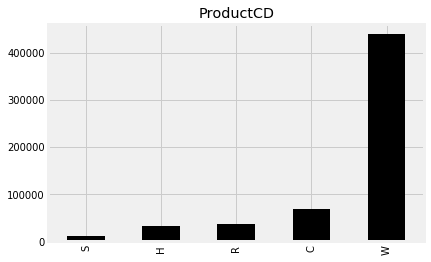

In [13]:
data['ProductCD'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "ProductCD",color = "black");

In [14]:
data.card4.unique()

array(['discover', 'mastercard', 'visa', 'american express'], dtype=object)

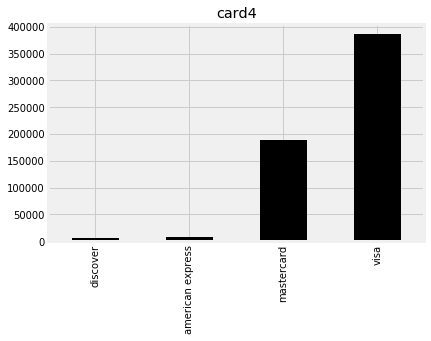

In [15]:
data['card4'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "card4",color = "black");

In [16]:
data.DeviceType.unique()

array(['desktop', 'mobile'], dtype=object)

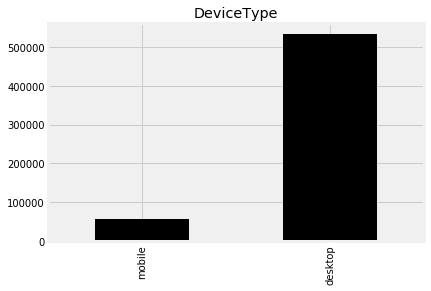

In [17]:
data['DeviceType'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "DeviceType",color = "black");

In [18]:
data.DeviceInfo.unique()

array(['Windows', 'SAMSUNG SM-G892A Build/NRD90M', 'iOS Device', ...,
       'LDN-LX3 Build/HUAWEILDN-LX3', 'Z955A', 'LG-E975'], dtype=object)

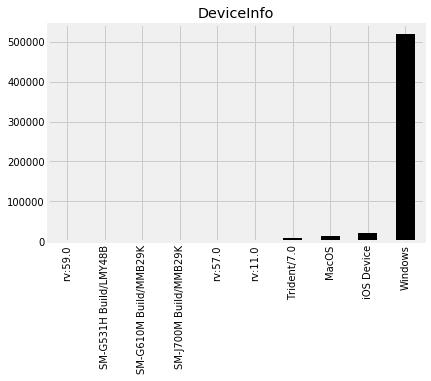

In [19]:
data['DeviceInfo'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "DeviceInfo",color = "black");

In [20]:
data.M1.unique()

array(['T', 'F'], dtype=object)

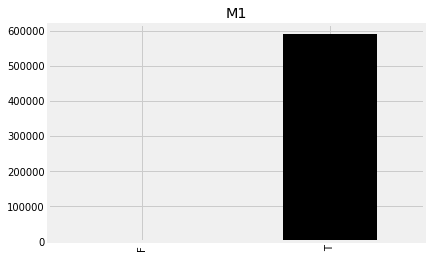

In [21]:
data['M1'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M1",color = "black");

In [22]:
data.M2.unique()

array(['T', 'F'], dtype=object)

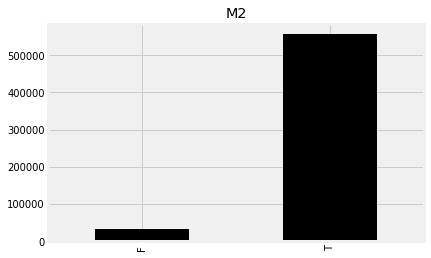

In [23]:
data['M2'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M2",color = "black");

In [24]:
data.M3.unique()

array(['T', 'F'], dtype=object)

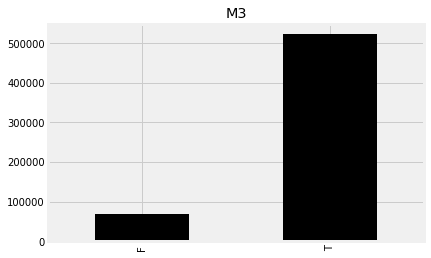

In [25]:
data['M3'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M3",color = "black");

In [26]:
data.M4.unique()

array(['M2', 'M0', 'M1'], dtype=object)

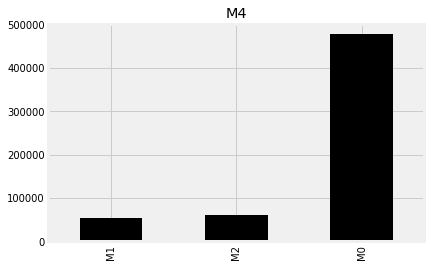

In [27]:
data['M4'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M4",color = "black");

In [28]:
data.M6.unique()

array(['T', 'F'], dtype=object)

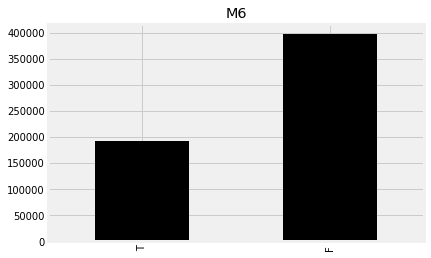

In [29]:
data['M6'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M6",color = "black");

In [30]:
data.M7.unique()

array(['F', 'T'], dtype=object)

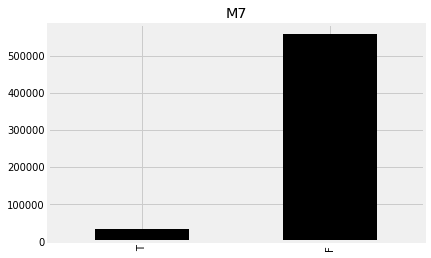

In [31]:
data['M7'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M7",color = "black");

In [32]:
data.M8.unique()

array(['F', 'T'], dtype=object)

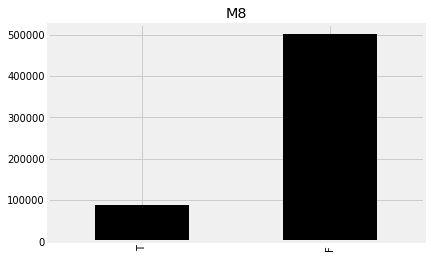

In [33]:
data['M8'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M8",color = "black");

In [34]:
data.M9.unique()

array(['T', 'F'], dtype=object)

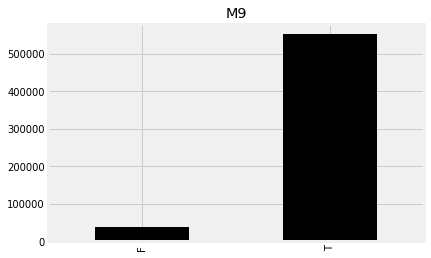

In [35]:
data['M9'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M9",color = "black");

In [36]:
data.card6.unique()

array(['credit', 'debit', 'debit or credit', 'charge card'], dtype=object)

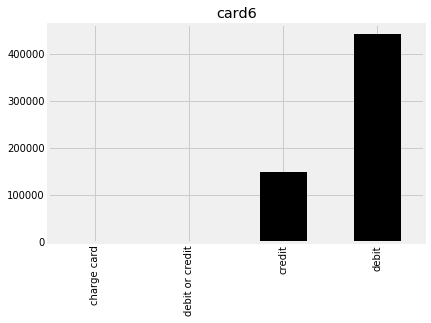

In [37]:
data['card6'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "card6",color = "black");

In [38]:
data.M5.unique()

array(['F', 'T'], dtype=object)

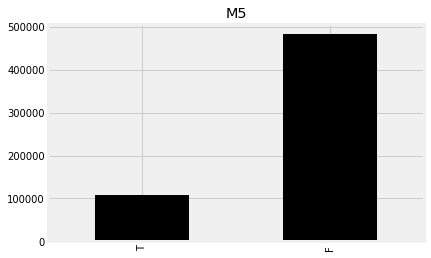

In [39]:
data['M5'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "M5",color = "black");

In [40]:
data.R_emaildomain.unique()

array(['gmail.com', 'hotmail.com', 'outlook.com', 'anonymous.com',
       'charter.net', 'prodigy.net.mx', 'comcast.net', 'live.com.mx',
       'icloud.com', 'yahoo.com', 'aol.com', 'juno.com', 'att.net',
       'verizon.net', 'yahoo.com.mx', 'bellsouth.net', 'servicios-ta.com',
       'ymail.com', 'hotmail.es', 'msn.com', 'optonline.net', 'live.com',
       'gmx.de', 'aim.com', 'mail.com', 'me.com', 'outlook.es', 'cox.net',
       'earthlink.net', 'embarqmail.com', 'web.de', 'sbcglobal.net',
       'scranton.edu', 'mac.com', 'twc.com', 'roadrunner.com', 'yahoo.fr',
       'yahoo.de', 'yahoo.es', 'frontiernet.net', 'gmail', 'live.fr',
       'q.com', 'yahoo.co.uk', 'windstream.net', 'suddenlink.net',
       'hotmail.fr', 'ptd.net', 'hotmail.de', 'frontier.com',
       'cfl.rr.com', 'hotmail.co.uk', 'netzero.com', 'netzero.net',
       'yahoo.co.jp', 'rocketmail.com', 'centurylink.net',
       'protonmail.com', 'cableone.net', 'sc.rr.com'], dtype=object)

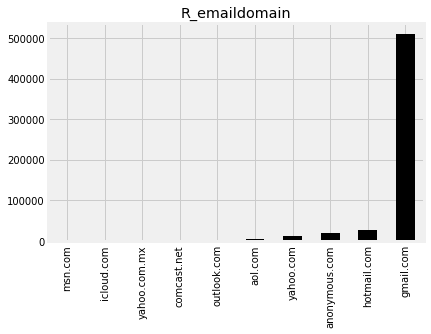

In [41]:
data['R_emaildomain'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "R_emaildomain",color = "black");

In [42]:
data.P_emaildomain.unique()

array(['gmail.com', 'outlook.com', 'yahoo.com', 'mail.com',
       'anonymous.com', 'hotmail.com', 'verizon.net', 'aol.com', 'me.com',
       'comcast.net', 'optonline.net', 'cox.net', 'charter.net',
       'rocketmail.com', 'prodigy.net.mx', 'embarqmail.com', 'icloud.com',
       'live.com.mx', 'gmail', 'live.com', 'att.net', 'juno.com',
       'ymail.com', 'sbcglobal.net', 'bellsouth.net', 'msn.com', 'q.com',
       'yahoo.com.mx', 'centurylink.net', 'servicios-ta.com',
       'earthlink.net', 'hotmail.es', 'cfl.rr.com', 'roadrunner.com',
       'netzero.net', 'gmx.de', 'suddenlink.net', 'frontiernet.net',
       'windstream.net', 'frontier.com', 'outlook.es', 'mac.com',
       'netzero.com', 'aim.com', 'web.de', 'twc.com', 'cableone.net',
       'yahoo.fr', 'yahoo.de', 'yahoo.es', 'sc.rr.com', 'ptd.net',
       'live.fr', 'yahoo.co.uk', 'hotmail.fr', 'hotmail.de',
       'hotmail.co.uk', 'protonmail.com', 'yahoo.co.jp'], dtype=object)

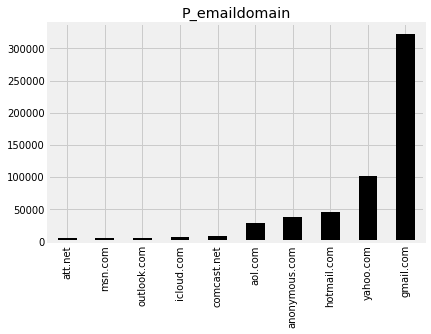

In [43]:
data['P_emaildomain'].value_counts().sort_values().tail(10).plot(kind = "bar", title = "P_emaildomain",color = "black");

In [44]:
START_DATE = '2017-12-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
data['Date'] = data['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
data['Date']

0        2017-12-02 00:00:00
1        2017-12-02 00:00:01
2        2017-12-02 00:01:09
3        2017-12-02 00:01:39
4        2017-12-02 00:01:46
                 ...        
590535   2018-06-01 23:57:27
590536   2018-06-01 23:57:29
590537   2018-06-01 23:57:59
590538   2018-06-01 23:58:08
590539   2018-06-01 23:58:51
Name: Date, Length: 590540, dtype: datetime64[ns]

In [45]:
#Label encoding

number = LabelEncoder()
for i in data.columns:
    if (data[i].dtype == 'object' or 'category' in str(data[i].dtype) or i == 'Date'):
        data[i] = number.fit_transform(data[i].astype('str'))


In [46]:
START_DATE = '2017-12-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
data['Date_tempo'] = data['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))

d1 = datetime.datetime(2018, 5, 1)
train_X = data[data['Date_tempo']<d1]
test_X = data[data['Date_tempo']>= d1]


train_X = train_X.drop('Date_tempo', axis = 1)
test_X = test_X.drop('Date_tempo', axis = 1)


y_train = train_X ['isFraud']
conta = sum(y_train) / len(y_train)

### Feature Importance with Covariate Shift 

In [47]:
# Taking sample from training and test data
training = train_X.sample(10000, random_state=12)
testing = test_X.sample(10000, random_state=11)


# Creating a new feature origin
training['origin'] = 0
testing['origin'] = 1
#droping target variable


# Combining random samples
combine = training.append(testing)
y = combine['origin']
combine.drop('origin',axis=1,inplace=True)

## Modelling
model = lgb.LGBMClassifier(n_estimators=1000, learning_rate = 0.05, verbose = 2)
drop_list = []
for i in combine.columns:
    score = cross_val_score(model,pd.DataFrame(combine[i]),y,cv=5,scoring='roc_auc')
    if (np.mean(score) > 0.55):
        drop_list.append(i)
        print(i,np.mean(score))
         

TransactionID 0.9999996
TransactionDT 0.9999996
D4 0.55370725
D10 0.564891375
D11 0.62076745
D15 0.5862396249999999
Date 0.9999996


In [48]:
#Dropping features with Covariate Shift

X_train  = train_X.drop(drop_list, axis = 1)
y_train = X_train['isFraud']
X_train  = X_train.drop('isFraud', axis = 1)


X_test = test_X.drop(drop_list, axis = 1)
y_test = X_test['isFraud']
X_test  = X_test.drop('isFraud', axis = 1)


In [49]:
X_train.shape, y_train.shape

((498113, 50), (498113,))

In [50]:
X_test.shape, y_test.shape

((92427, 50), (92427,))

In [51]:
#These features are selected after Covariate Shift

features = X_train.columns
print(features)


Index(['TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4',
       'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain',
       'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9',
       'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D5', 'D6', 'D7',
       'D8', 'D9', 'D12', 'D13', 'D14', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6',
       'M7', 'M8', 'M9', 'DeviceType', 'DeviceInfo'],
      dtype='object')


# Model Interpretation for Machine Learning

### In order to do Interpretation for Machine Learning, we will use Permuted Feature Importance, Partial Dependent Plot (PDP), Shapley Additive Explanations (SHAP), Individual Conditional Expectation (ICE), Global and Local Surrogate (LIME) methods. 


### First of all, we will try out the global feature importances calcuations that come with XGBoost. 
#### Feature Weights: This is based on the number of times a feature appears in a tree across the ensemble of trees
#### Gain: This is based on the average gain of splits which use the feature
#### Coverage: This is based on the average coverage (number of samples affected) of splits which use the feature

In [52]:
#Training the XGBoost model
xgb_model = xgb.XGBClassifier().fit(X_train, y_train)

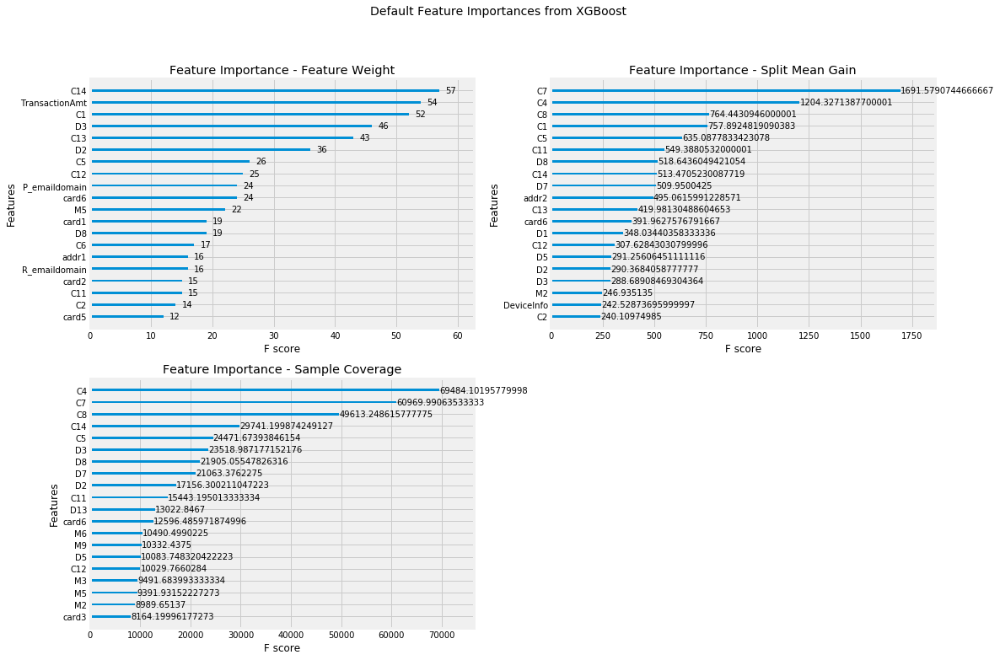

In [53]:
fig = plt.figure(figsize = (16, 12))
title = fig.suptitle("Default Feature Importances from XGBoost", fontsize=14)

ax1 = fig.add_subplot(2,2, 1)
xgb.plot_importance(xgb_model, importance_type='weight', ax=ax1, max_num_features=20)
t=ax1.set_title("Feature Importance - Feature Weight")

ax2 = fig.add_subplot(2,2, 2)
xgb.plot_importance(xgb_model, importance_type='gain', ax=ax2, max_num_features=20)
t=ax2.set_title("Feature Importance - Split Mean Gain")

ax3 = fig.add_subplot(2,2, 3)
xgb.plot_importance(xgb_model, importance_type='cover', ax=ax3, max_num_features=20)
t=ax3.set_title("Feature Importance - Sample Coverage")


**In this graph among of top Non-Categorical Features there are C1, C14, C13, TransactionAmt, C12, C5, D2, D1, card1, C8, C2, D3, D8, C4, card3, card2. Top Categorical Features are M5, card6, P_emaildomain, R_emaildomain.**

##  Permutated Feature Importance with ELI5 library


#### The idea of Permutated Feature Importance is that randomly permutate (shuffle) a single column in the validation dataset leaving all the other columns intact. A feature is considered “important” if the model’s accuracy drops a lot and causes an increase in error. On the other hand, a feature is considered ‘unimportant’ if shuffling its values don’t affect the model’s accuracy.

In [54]:
perm = PermutationImportance(xgb_model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = list(X_test.columns), top=20)

Weight,Feature
0.0083 ± 0.0002,C1
0.0036 ± 0.0002,C14
0.0014 ± 0.0001,C4
0.0012 ± 0.0003,C5
0.0011 ± 0.0002,C13
0.0008 ± 0.0001,D8
0.0007 ± 0.0001,C2
0.0007 ± 0.0001,C8
0.0004 ± 0.0001,C11
0.0004 ± 0.0002,TransactionAmt


#### **The values towards the top are the most important features, and those towards the bottom matter least. Here we can see that top non categorical features are C1, C14, C4, C13, C8, D2, TransactionAmt, C12, C11, C2, C5, C7, D3, C9, D9, card1, D5. Top Categorical feature is card6 and DeviceType.**

### Partial Dependence Plots of XGBoost and LightGBM models with PDPbox library

#### Partial Dependence describes the marginal impact of a feature on model prediction, holding other features in the model constant. The derivative of partial dependence describes the impact of a feature. While classic feature importance shows what variables most affect predictions, partial dependence plots show how a feature affects predictions. Like permutation importance, partial dependence plots are calculated after a model has been fit. The model is fit on real data that has not been artificially manipulated in any way.

In [55]:
lgb_params =  {'num_leaves': 491,
         'min_child_weight': 0.03454472573214212,
         'feature_fraction': 0.3797454081646243,
         'bagging_fraction': 0.4181193142567742,
         'min_data_in_leaf': 106,
         'objective': 'binary',
         'max_depth': -1,
         'learning_rate': 0.006883242363721497,
         "boosting_type": "gbdt",
         "bagging_seed": 11,
         "metric": 'auc',
         'reg_alpha': 0.3899927210061127,
         'reg_lambda': 0.6485237330340494,
         'random_state': 47 }

In [56]:
#Training the LightGBM model

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test)
lgb_model = lgb.train(lgb_params,lgb_train,num_boost_round=20,valid_sets=lgb_eval,early_stopping_rounds=5)

[1]	valid_0's auc: 0.831666
Training until validation scores don't improve for 5 rounds
[2]	valid_0's auc: 0.851348
[3]	valid_0's auc: 0.86562
[4]	valid_0's auc: 0.86801
[5]	valid_0's auc: 0.872411
[6]	valid_0's auc: 0.876377
[7]	valid_0's auc: 0.876804
[8]	valid_0's auc: 0.878613
[9]	valid_0's auc: 0.879624
[10]	valid_0's auc: 0.881291
[11]	valid_0's auc: 0.881366
[12]	valid_0's auc: 0.881315
[13]	valid_0's auc: 0.881888
[14]	valid_0's auc: 0.882876
[15]	valid_0's auc: 0.885069
[16]	valid_0's auc: 0.8861
[17]	valid_0's auc: 0.887646
[18]	valid_0's auc: 0.887488
[19]	valid_0's auc: 0.888189
[20]	valid_0's auc: 0.888095
Did not meet early stopping. Best iteration is:
[19]	valid_0's auc: 0.888189


#### Now we will check PDP plots for the non categical features that we have selected above based on Global feature importance and Permutated Feature Importance. The y axis is interpreted as change in the prediction from what it would be predicted at the baseline or leftmost value. y axis shows a prediction of Fraud from 0 to 1. A blue shaded area indicates level of confidence. 

## Non-Categorical Features

### Positive correlation with Fraud

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


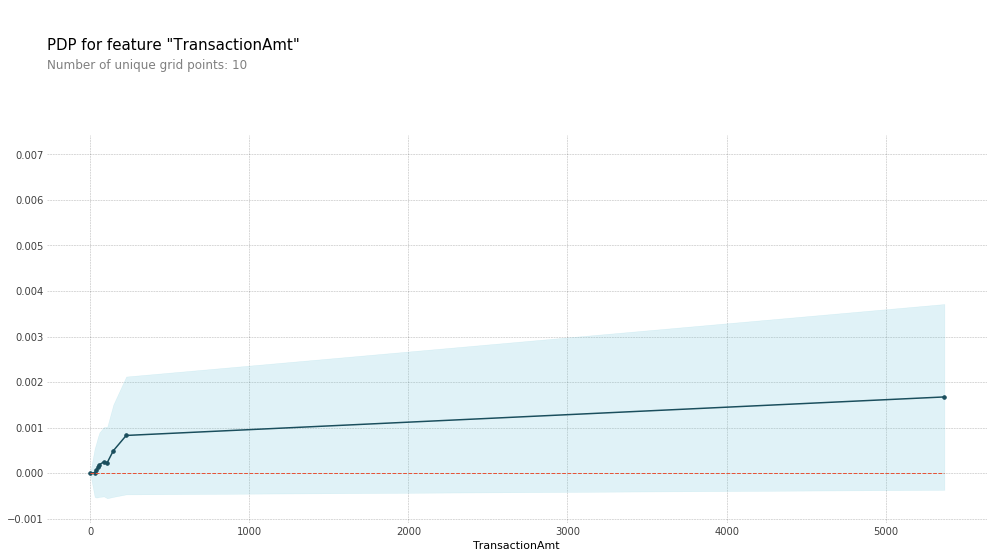

In [57]:
# Create the data and plot it
pdp_trans = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='TransactionAmt')
pdp.pdp_plot(pdp_trans, 'TransactionAmt')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that Transaction Amount between 1-250 substantially increases the chances of existence of Fraud. But extra transactions beyond that appear to have little impact on predictions. 

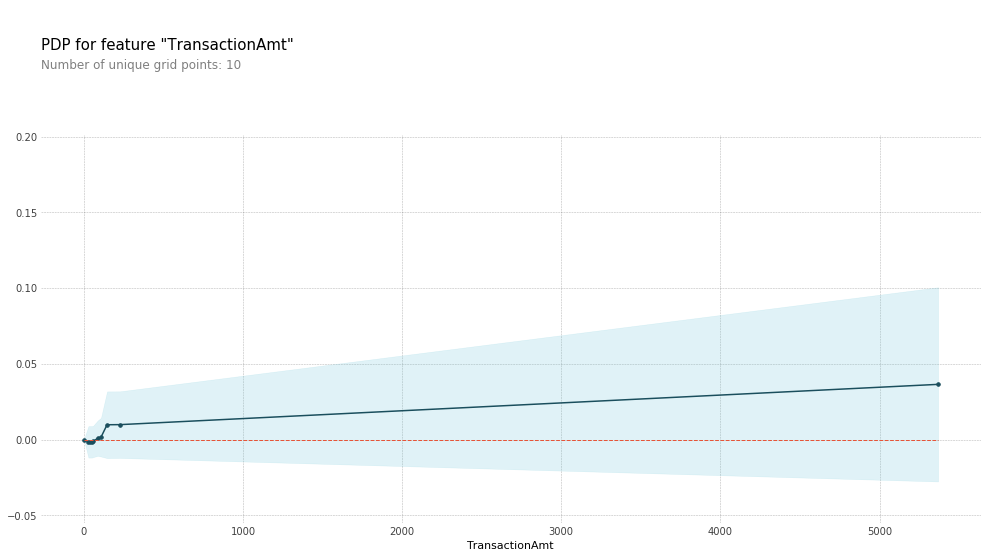

In [58]:
# Create the data and plot it
pdp_trans = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='TransactionAmt')
pdp.pdp_plot(pdp_trans, 'TransactionAmt')
plt.show()

### ----> C Features

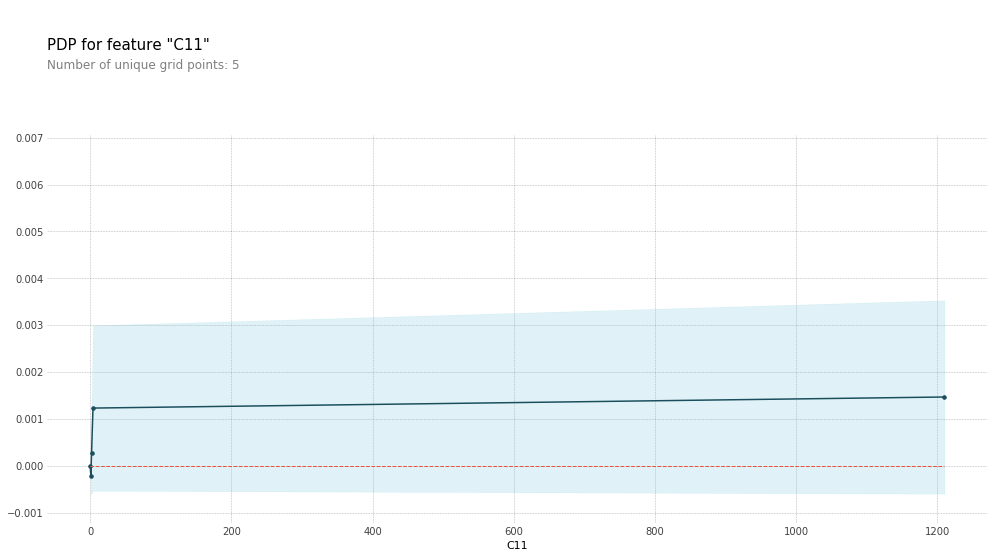

In [59]:
# Create the data and plot it
pdp_c11 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C11')
pdp.pdp_plot(pdp_c11, 'C11')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C11 between 1-5 dramaticly increases the chances of existence of Fraud. But extra transactions beyond that appear to have little impact on predictions.¶

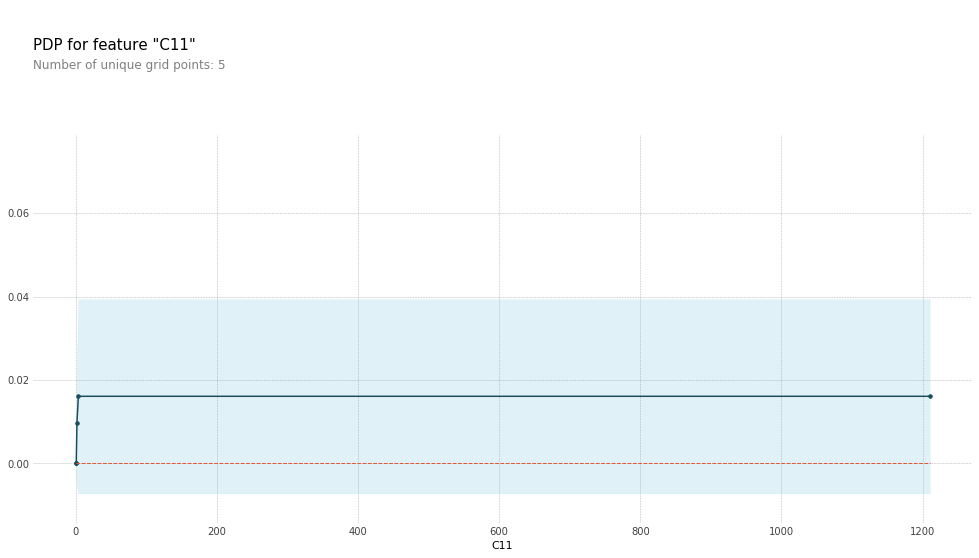

In [60]:
# Create the data and plot it
pdp_c11 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C11')
pdp.pdp_plot(pdp_c11, 'C11')
plt.show()

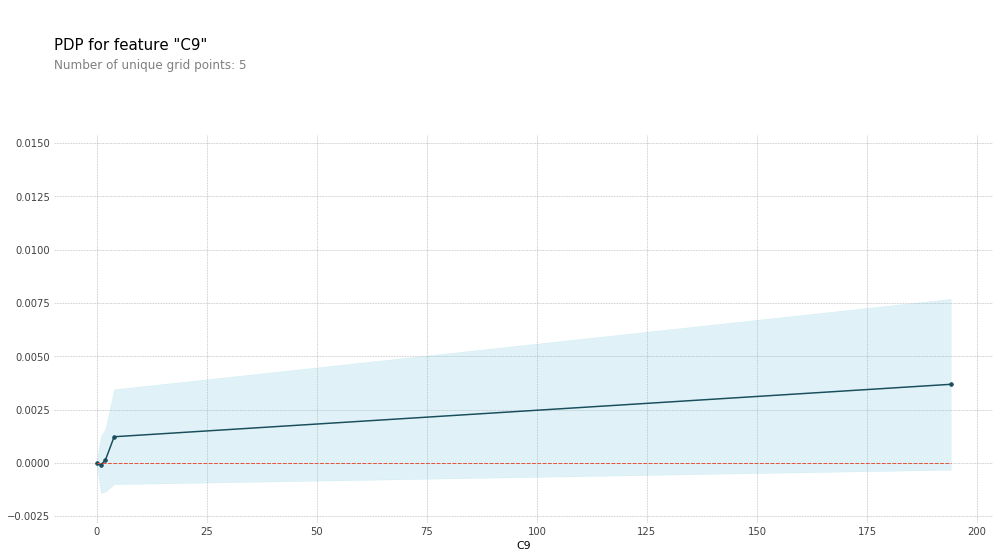

In [61]:
# Create the data and plot it
pdp_c9 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C9')
pdp.pdp_plot(pdp_c9, 'C9')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C9 between 1-5 substantially increases the chances of existence of Fraud. Extra transactions beyond that appear to give some increasing impact on predictions.¶

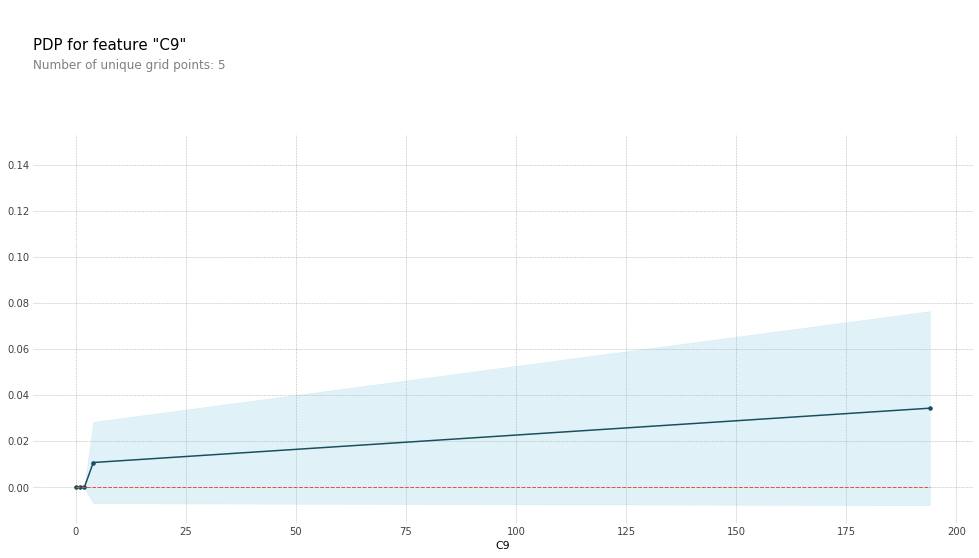

In [62]:
# Create the data and plot it
pdp_c9 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C9')
pdp.pdp_plot(pdp_c9, 'C9')
plt.show()

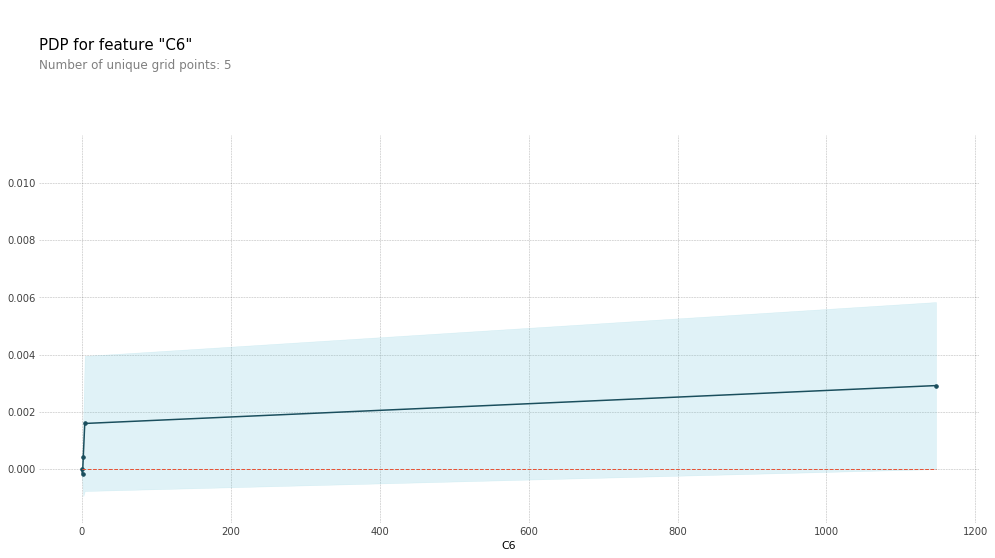

In [63]:
# Create the data and plot it
pdp_c6 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C6')
pdp.pdp_plot(pdp_c6, 'C6')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C6 between 1-5 dramaticly increases the chances of existence of Fraud. But extra transactions beyond that appear to have little impact on predictions.

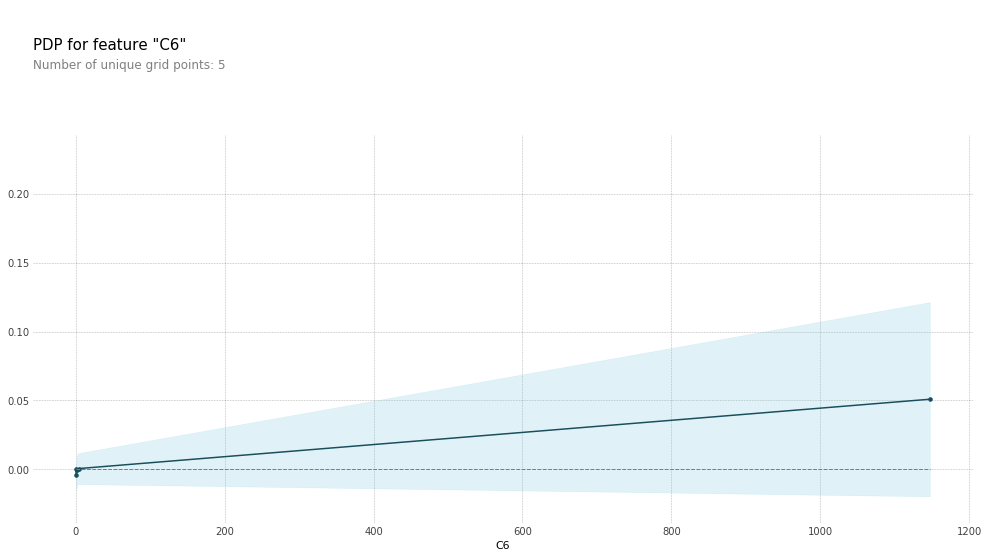

In [64]:
# Create the data and plot it
pdp_c6 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C6')
pdp.pdp_plot(pdp_c6, 'C6')
plt.show()

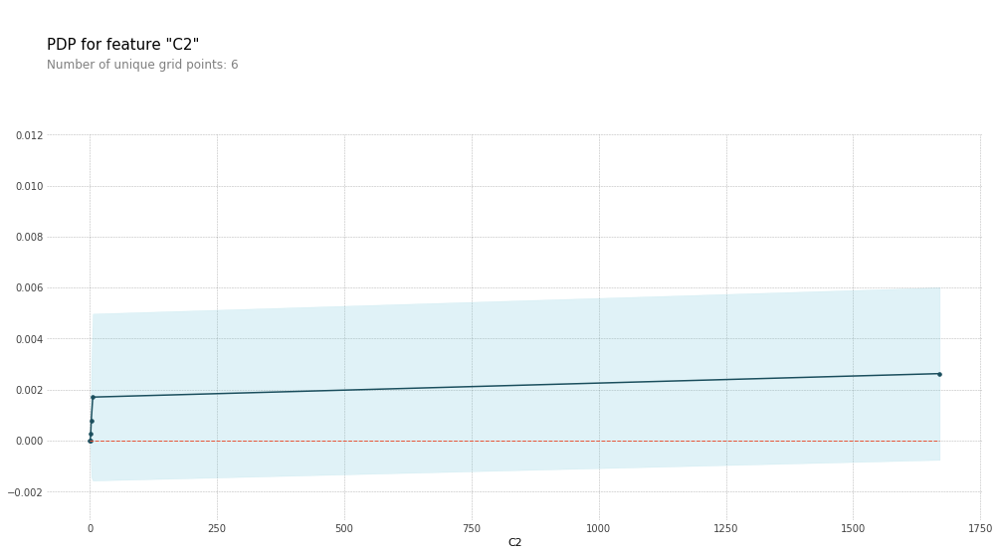

In [65]:
# Create the data and plot it
pdp_c2 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C2')
pdp.pdp_plot(pdp_c2, 'C2')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C2 between 1-5 dramaticly increases the chances of existence of Fraud. But extra transactions beyond that appear to have little impact on predictions.

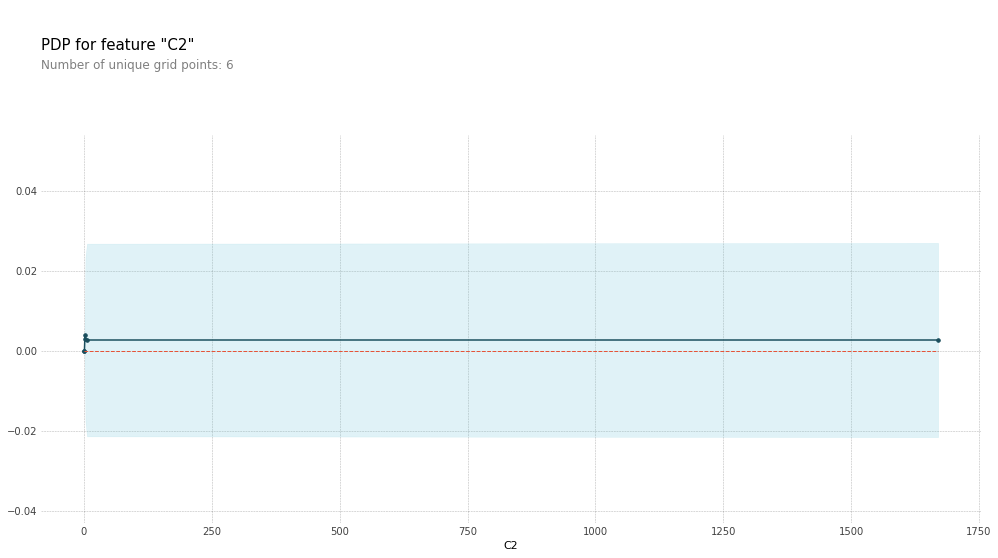

In [66]:
# Create the data and plot it
pdp_c2 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C2')
pdp.pdp_plot(pdp_c2, 'C2')
plt.show()

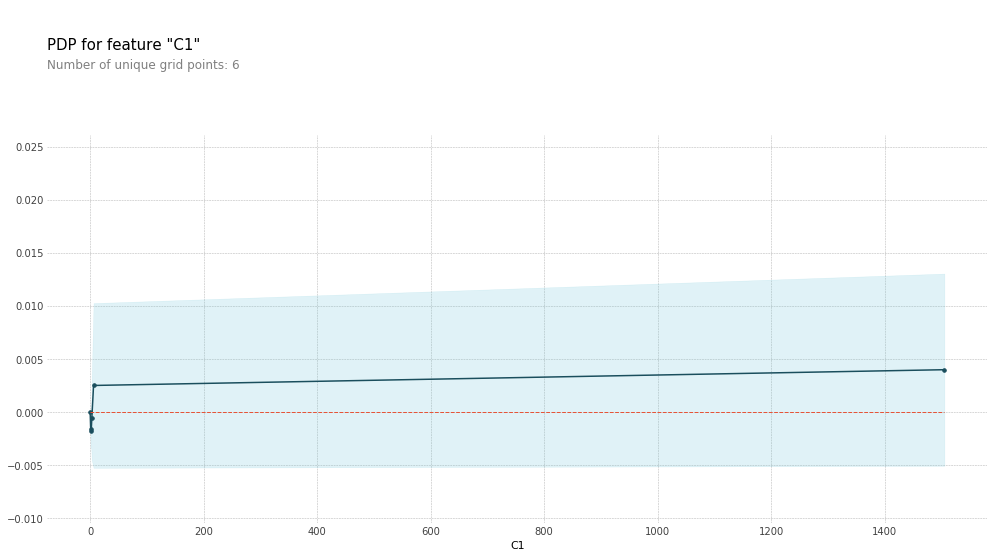

In [67]:
# Create the data and plot it
pdp_c1 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C1')
pdp.pdp_plot(pdp_c1, 'C1')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C1 between 1-5 dramaticly increases the chances of existence of Fraud. But extra transactions beyond that appear to have little impact on predictions.

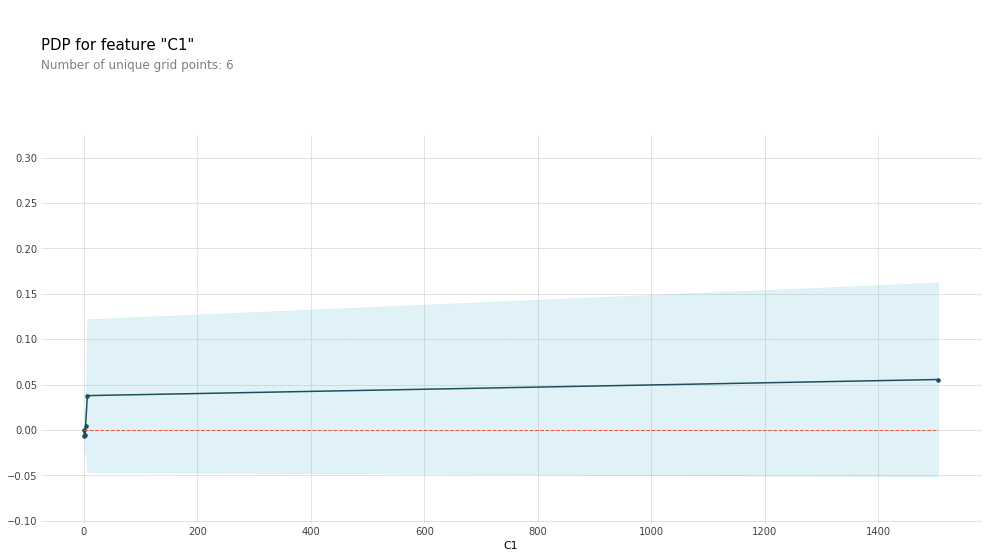

In [68]:
# Create the data and plot it
pdp_c1 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C1')
pdp.pdp_plot(pdp_c1, 'C1')
plt.show()

### Negative correlation with Fraud

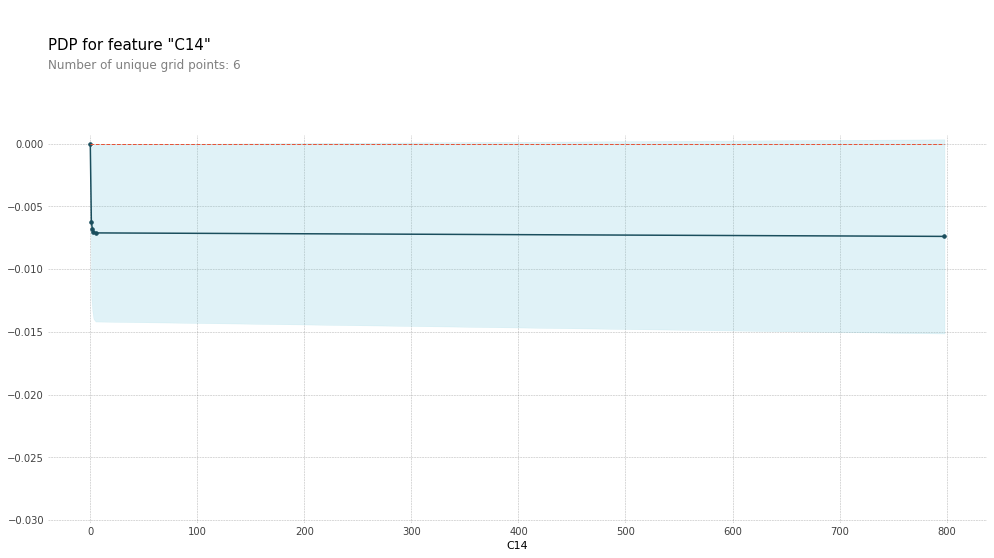

In [69]:
# Create the data that we will plot
pdp_c14 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C14')

# plot it
pdp.pdp_plot(pdp_c14, 'C14')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C14 between 1-5 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions.

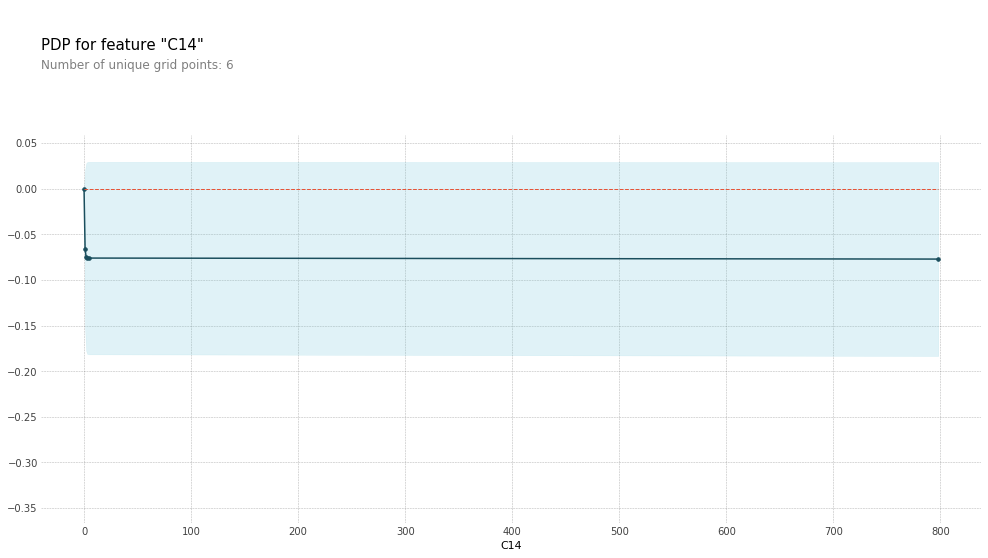

In [70]:
# Create the data that we will plot
pdp_c14 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C14')

# plot it
pdp.pdp_plot(pdp_c14, 'C14')
plt.show()

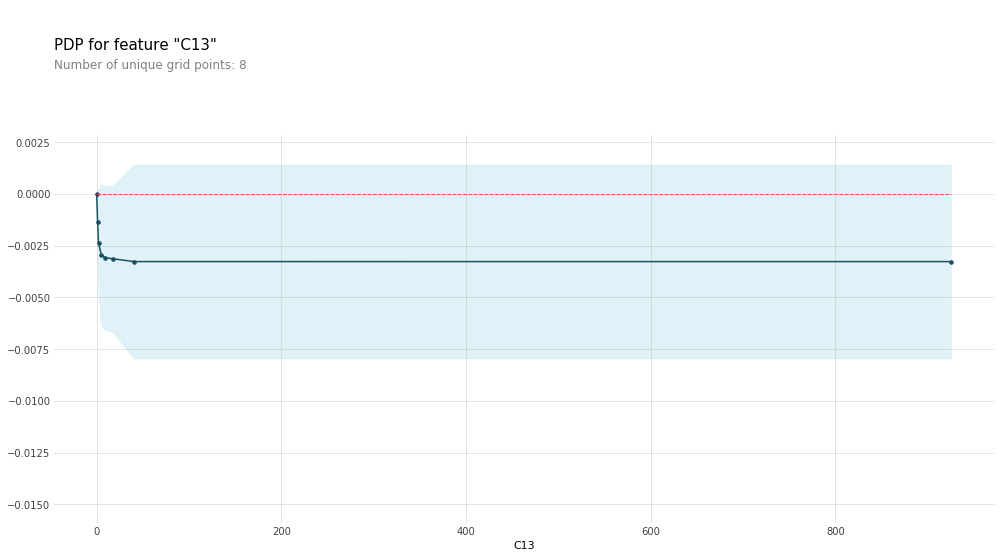

In [71]:
# Create the data that we will plot
pdp_c13 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C13')

# plot it
pdp.pdp_plot(pdp_c13, 'C13')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C13 between 1-50 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions

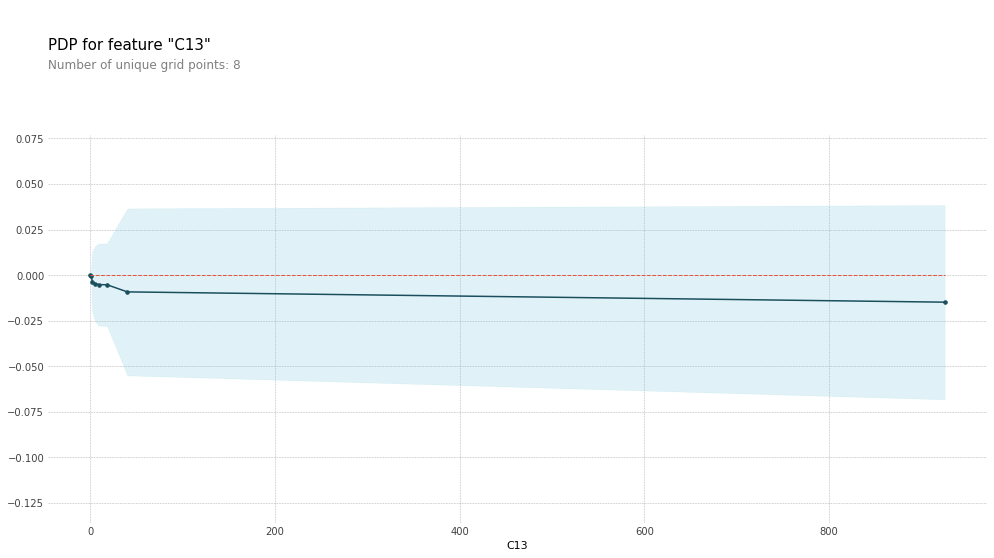

In [72]:
# Create the data that we will plot
pdp_c13 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C13')

# plot it
pdp.pdp_plot(pdp_c13, 'C13')
plt.show()

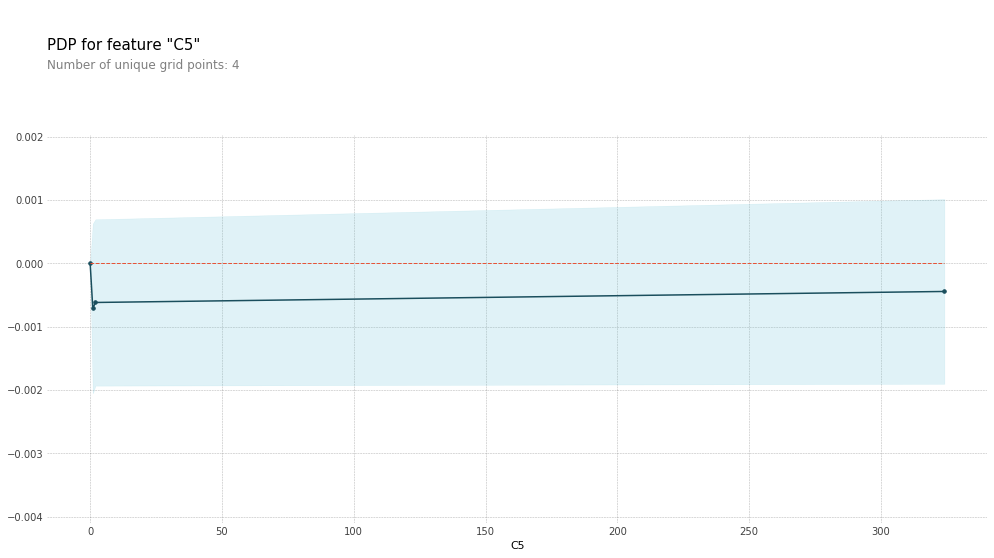

In [73]:
# Create the data that we will plot
pdp_c5 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C5')

# plot it
pdp.pdp_plot(pdp_c5, 'C5')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C5 between 1-5 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions.¶

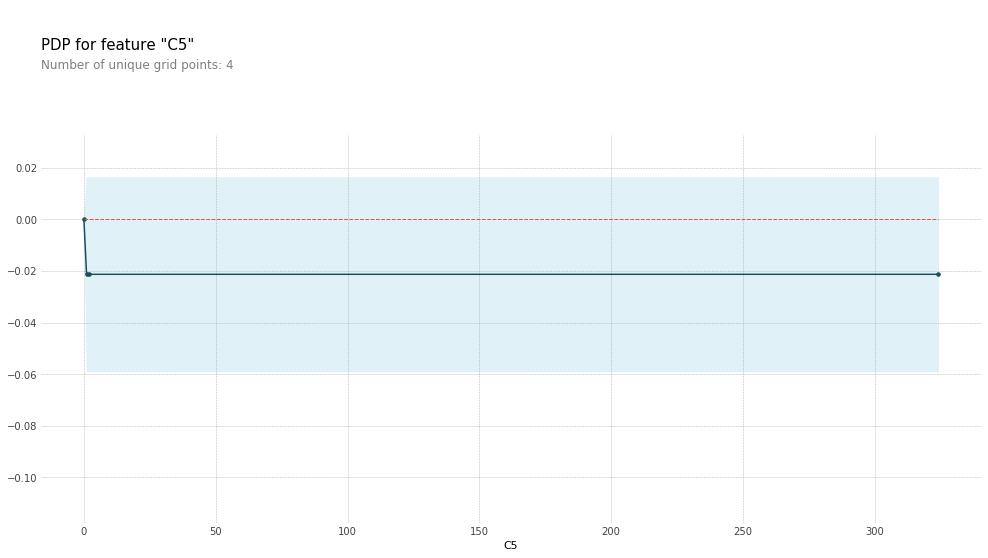

In [74]:
# Create the data that we will plot
pdp_c5 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C5')

# plot it
pdp.pdp_plot(pdp_c5, 'C5')
plt.show()

### No significant correlation with Fraud

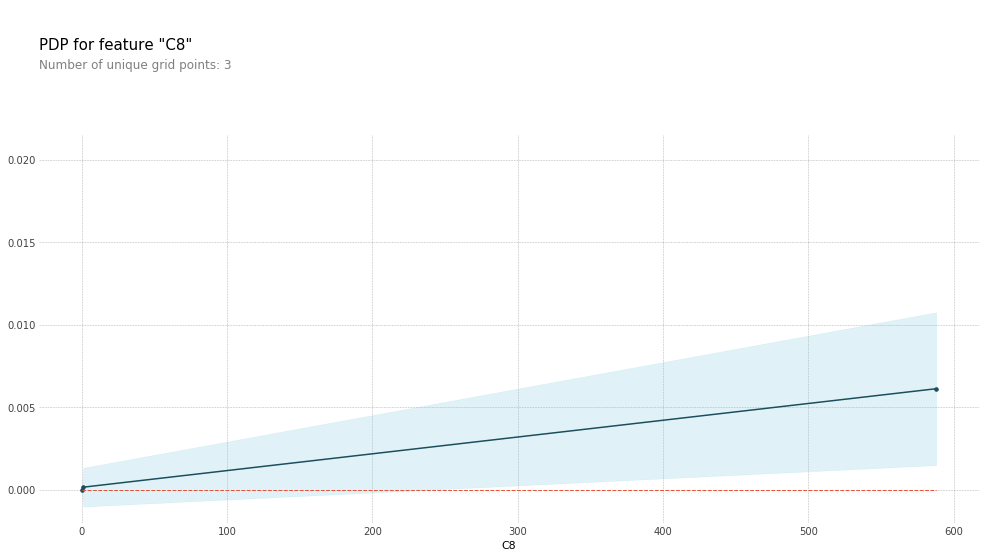

In [75]:
# Create the data that we will plot
pdp_c8 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C8')

# plot it
pdp.pdp_plot(pdp_c8, 'C8')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C8 is dicreasing from 1-5 range and then constantly increasing until 600. But since it does not correspond to TransactionAmt graph, it means it does not significantly influence on predictions and does not influence on existence of Fraud. Therefore, we will exclude this feature for further analysis.

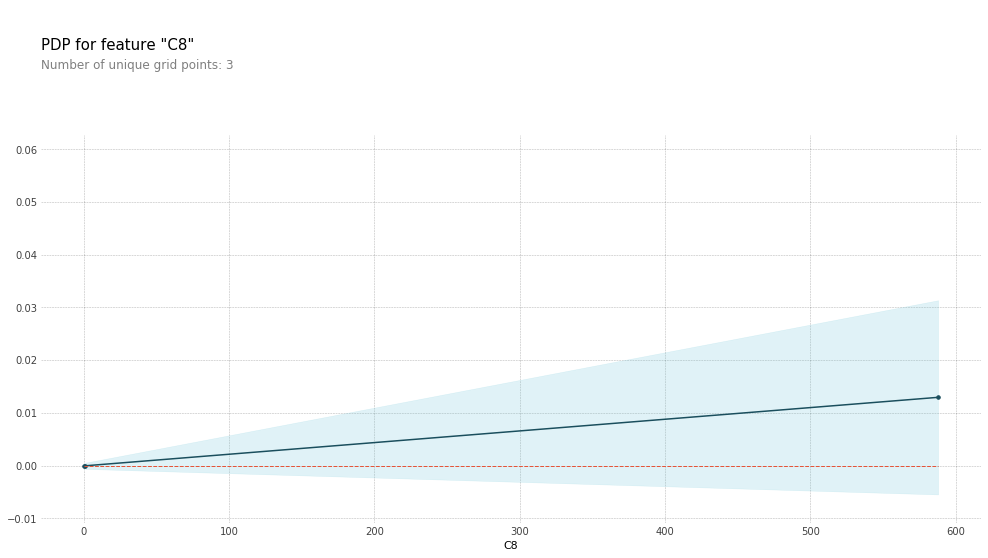

In [76]:
# Create the data that we will plot
pdp_c8 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C8')

# plot it
pdp.pdp_plot(pdp_c8, 'C8')
plt.show()

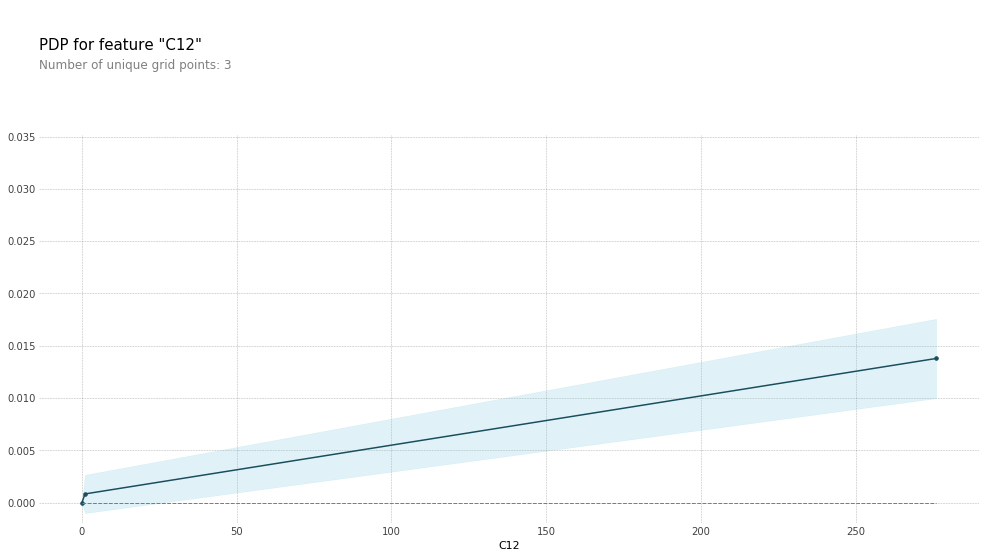

In [77]:
# Create the data that we will plot
pdp_c12 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C12')

# plot it
pdp.pdp_plot(pdp_c12, 'C12')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C12 is constantly increasing from 0 to 300. But since it does not correspond to TransactionAmt graph, it means it does not significantly influence on predictions and does not influence on existence of Fraud. Therefore, we will exclude this feature for further analysis.

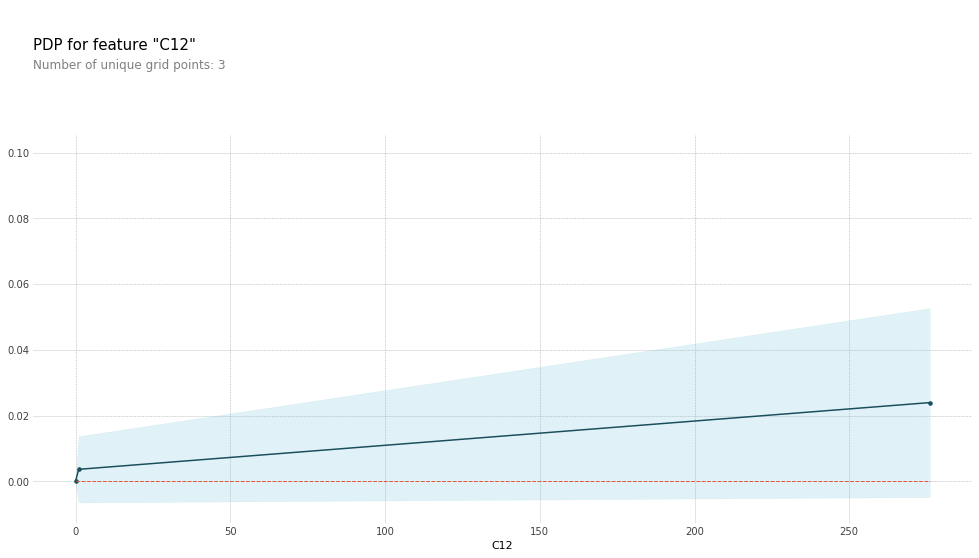

In [78]:
# Create the data that we will plot
pdp_c12 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C12')

# plot it
pdp.pdp_plot(pdp_c12, 'C12')
plt.show()

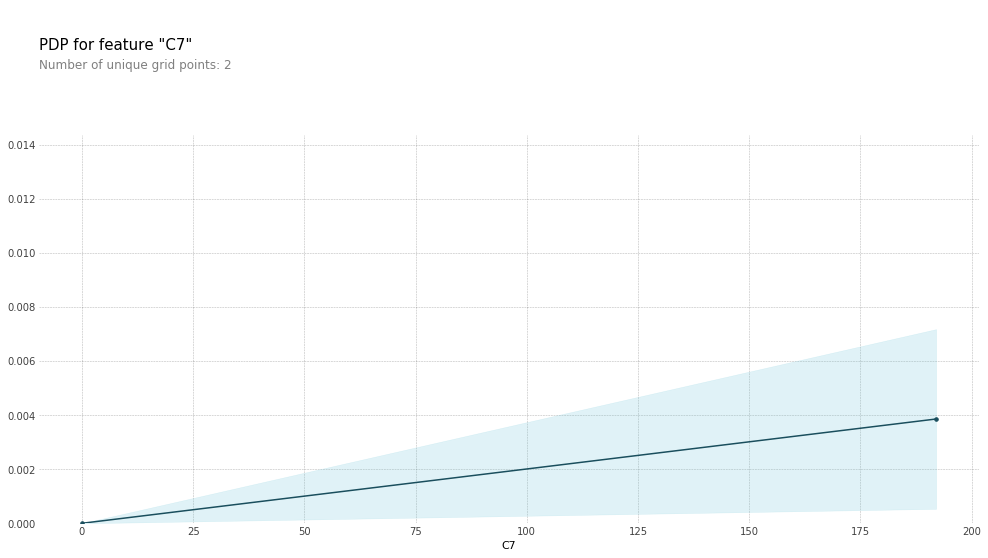

In [79]:
# Create the data that we will plot
pdp_c7 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C7')

# plot it
pdp.pdp_plot(pdp_c7, 'C7')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C7 is constantly increasing from 0 to 200. But since it does not correspond to TransactionAmt graph, it means it does not significantly influence on predictions and does not influence on existence of Fraud. Therefore, we will exclude this feature for further analysis.

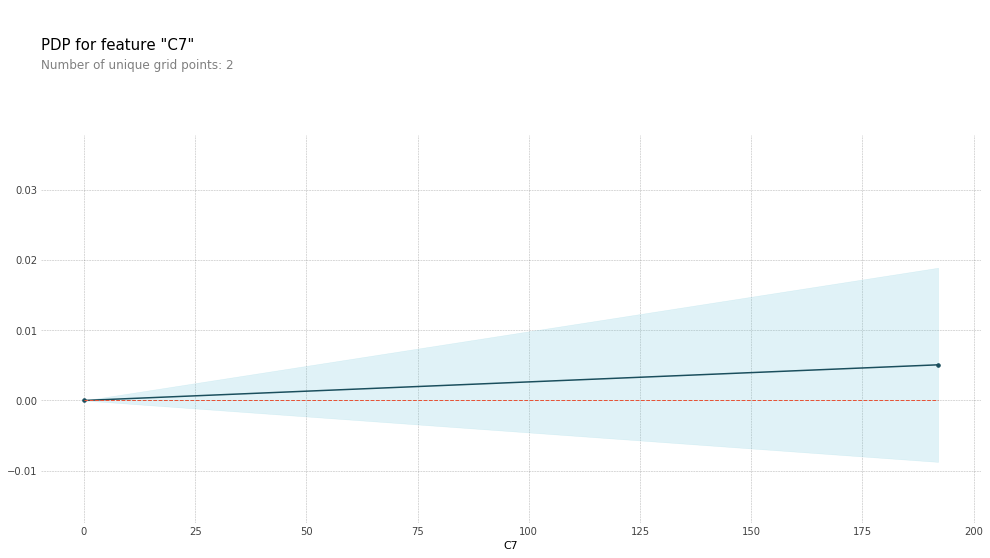

In [80]:
# Create the data that we will plot
pdp_c7 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C7')

# plot it
pdp.pdp_plot(pdp_c7, 'C7')
plt.show()

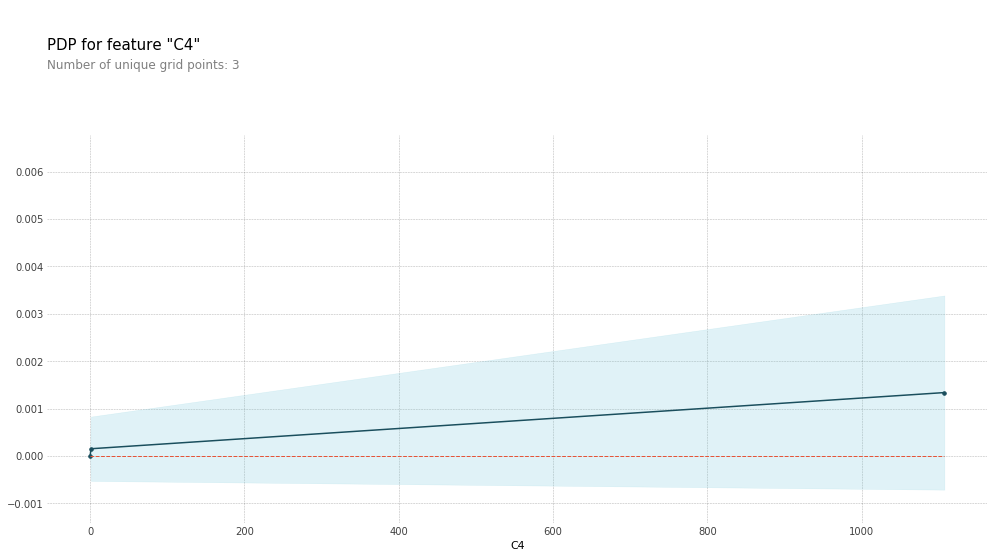

In [81]:
# Create the data that we will plot
pdp_c4 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C4')

# plot it
pdp.pdp_plot(pdp_c4, 'C4')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that C4 is constantly increasing from 0 to 1500. But since it does not correspond to TransactionAmt graph, it means it does not significantly influence on predictions and does not influence on existence of Fraud. Therefore, we will exclude this feature for further analysis.

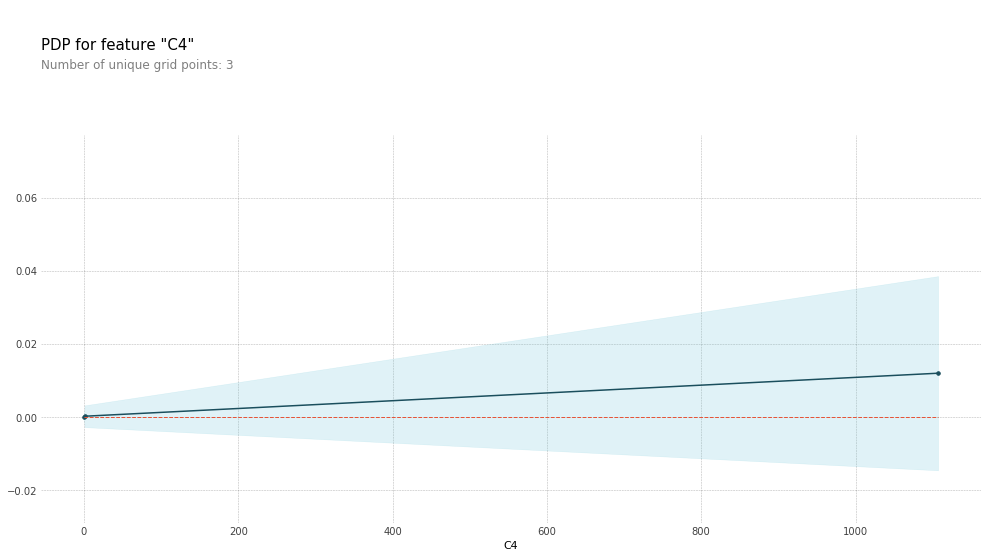

In [82]:
# Create the data that we will plot
pdp_c4 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='C4')

# plot it
pdp.pdp_plot(pdp_c4, 'C4')
plt.show()

### ---> D Features

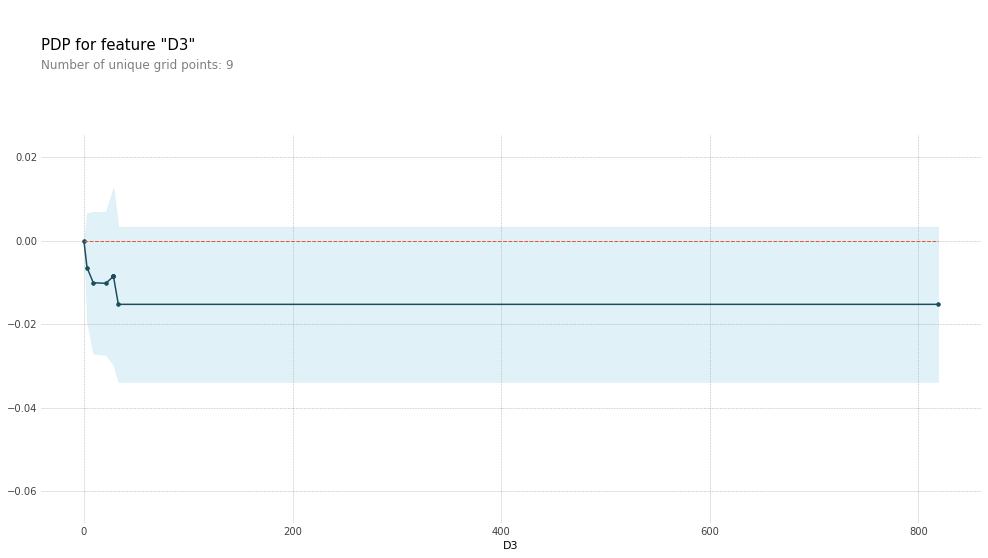

In [83]:
# Create the data that we will plot
pdp_d3 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D3')

# plot it
pdp.pdp_plot(pdp_d3, 'D3')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D3 between 1-50 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have no impact on predictions

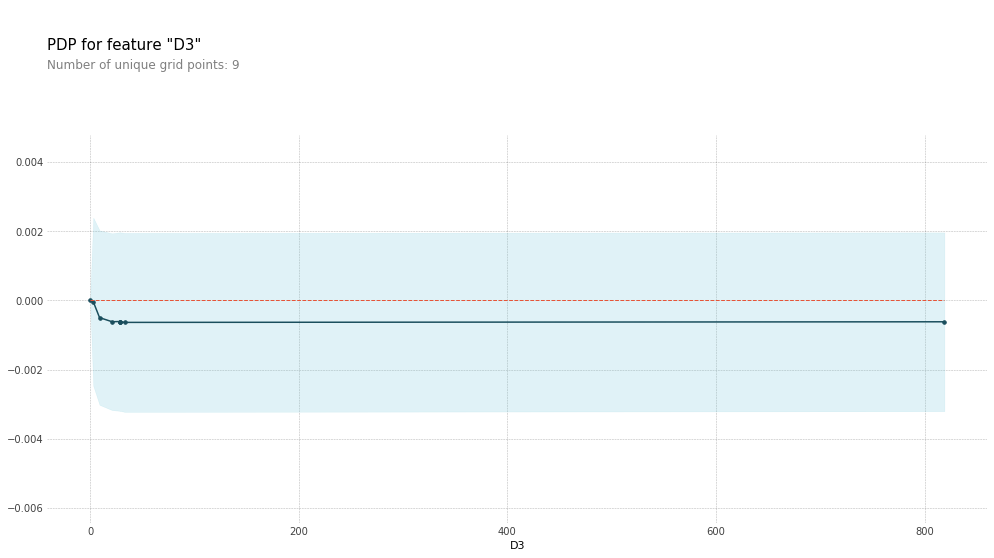

In [84]:
# Create the data and plot it
pdp_d3 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D3')
pdp.pdp_plot(pdp_d3, 'D3')
plt.show()

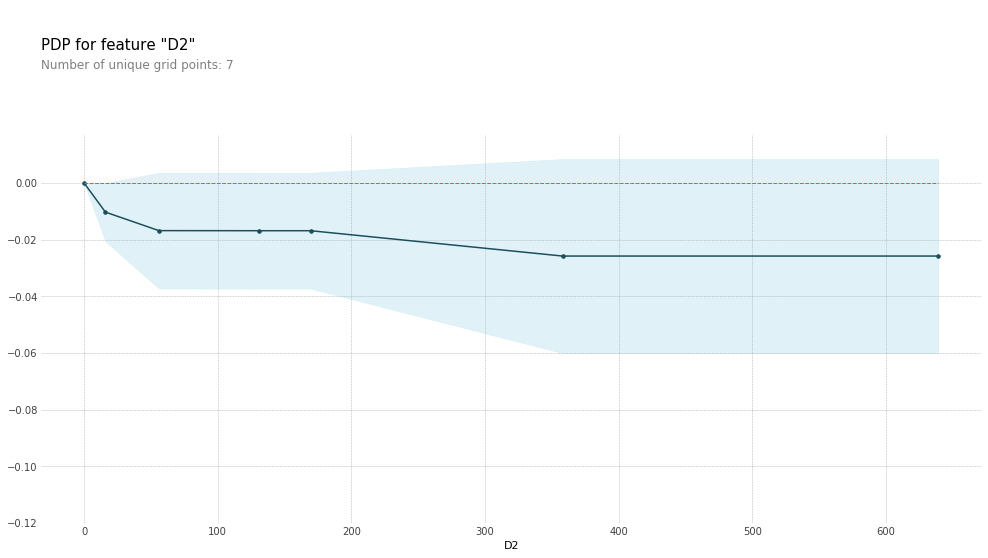

In [85]:
# Create the data that we will plot
pdp_d2 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D2')

# plot it
pdp.pdp_plot(pdp_d2, 'D2')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D3 between 1-50 decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions

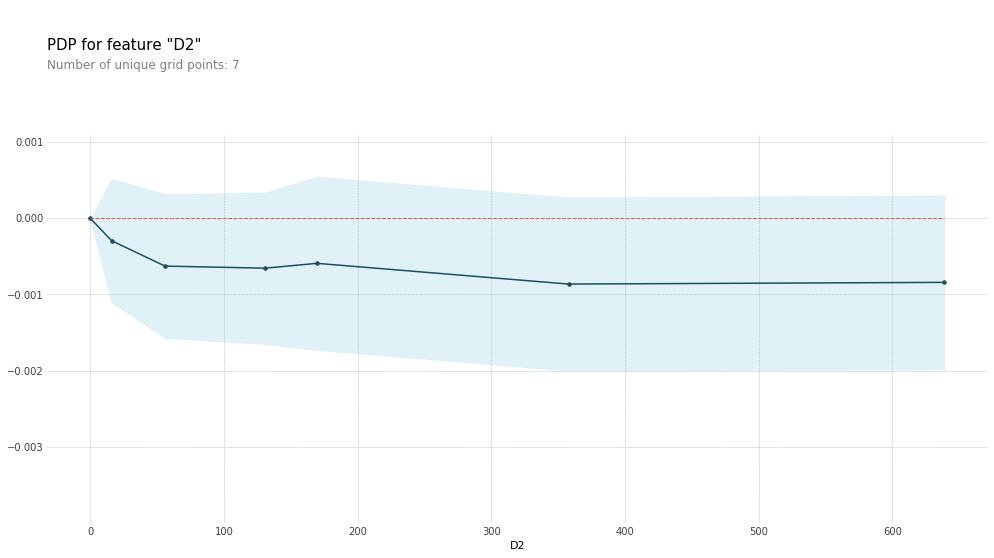

In [86]:
# Create the data and plot it
pdp_d2 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D2')
pdp.pdp_plot(pdp_d2, 'D2')
plt.show()

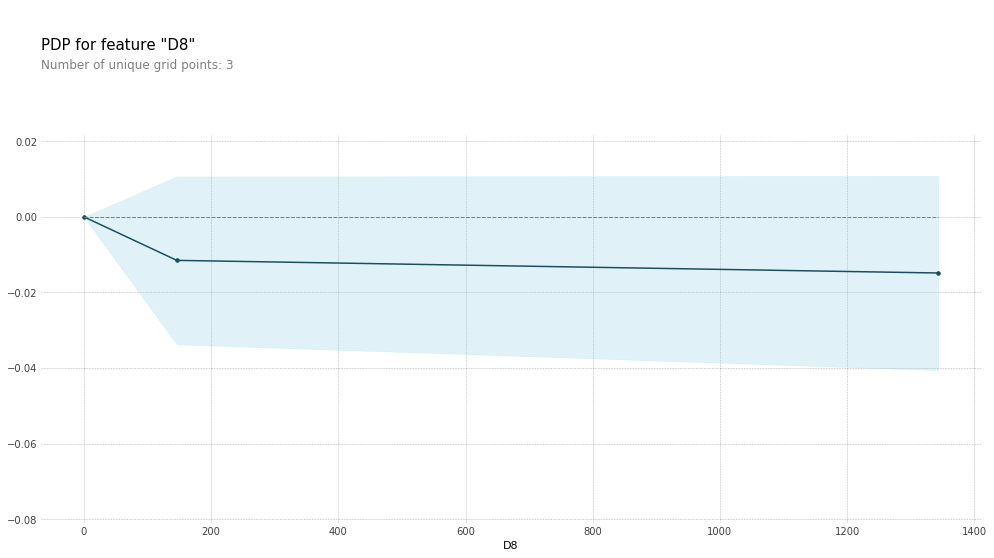

In [87]:
# Create the data that we will plot
pdp_d8 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D8')

# plot it
pdp.pdp_plot(pdp_d8, 'D8')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D8 between 1-180 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have no impact on predictions

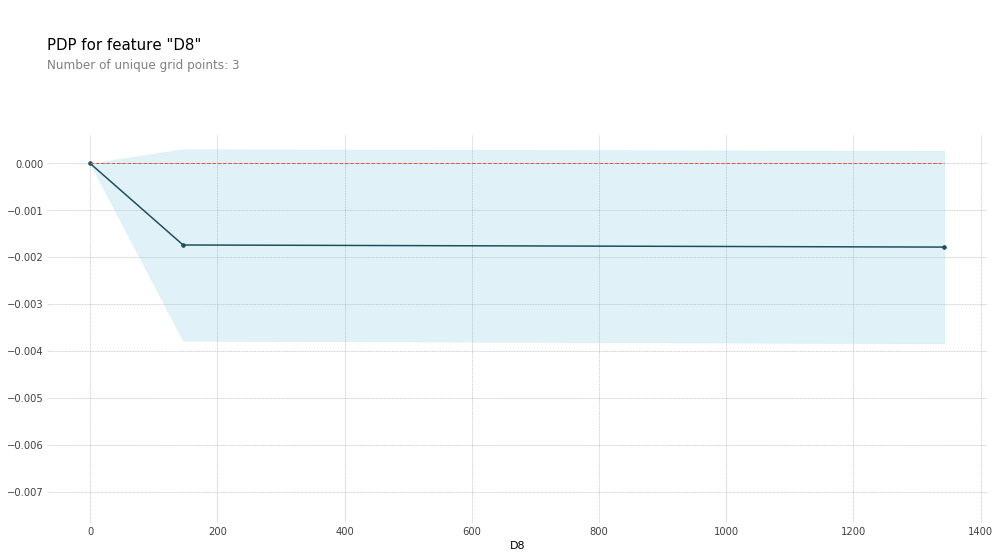

In [88]:
# Create the data and plot it
pdp_d8 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D8')
pdp.pdp_plot(pdp_d8, 'D8')
plt.show()

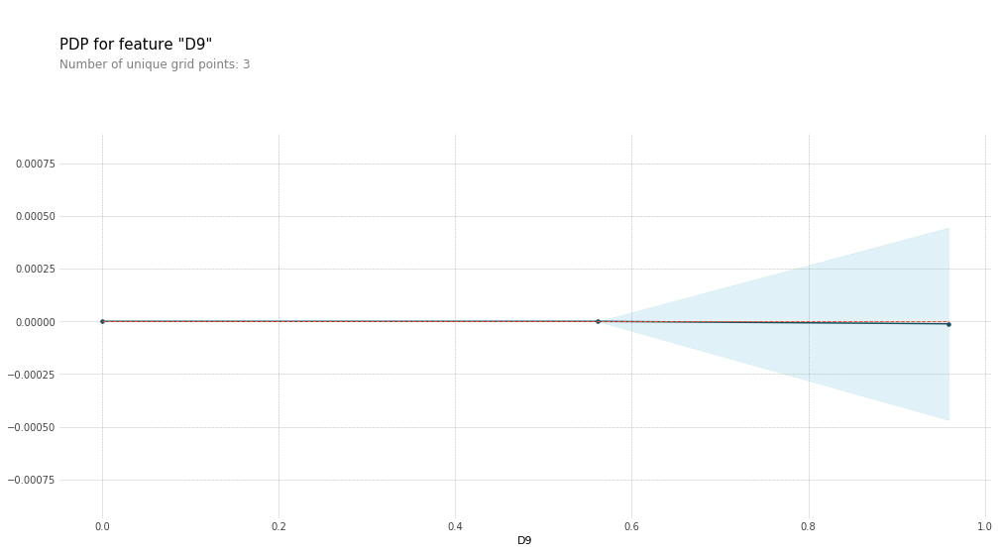

In [89]:
# Create the data that we will plot
pdp_d9 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D9')

# plot it
pdp.pdp_plot(pdp_d9, 'D9')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D9 around 0.8 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have no impact on predictions

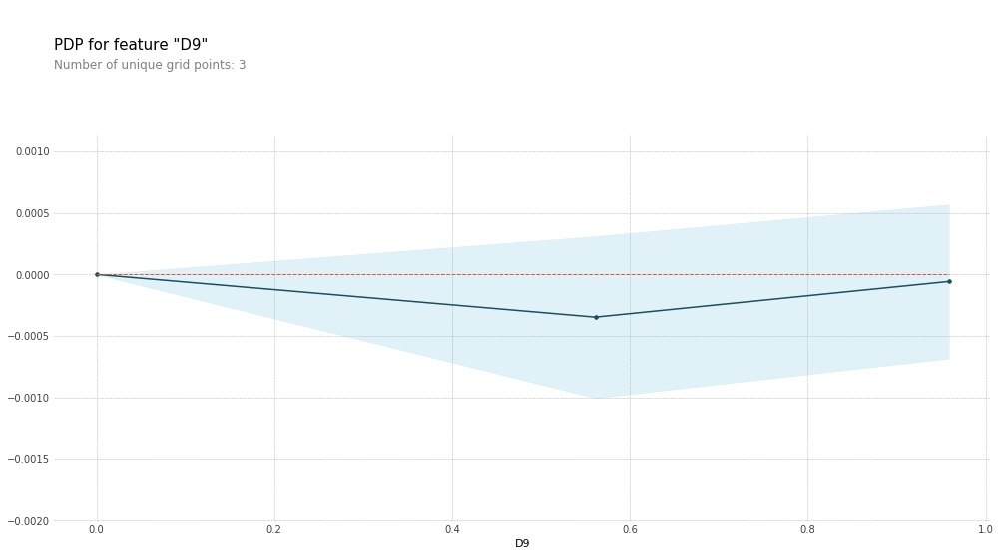

In [90]:
# Create the data and plot it
pdp_d9 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D9')
pdp.pdp_plot(pdp_d9, 'D9')
plt.show()

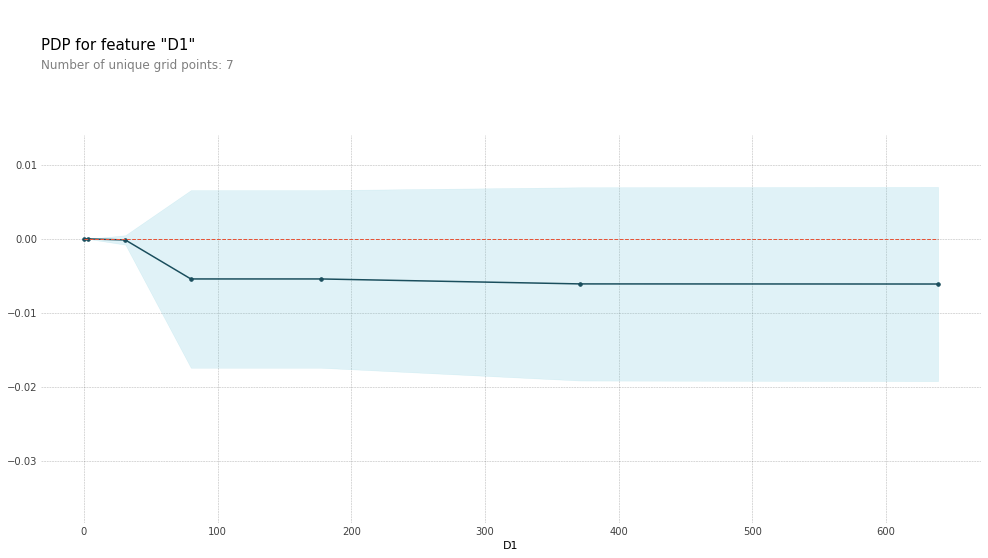

In [91]:
# Create the data that we will plot
pdp_d1 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D1')

# plot it
pdp.pdp_plot(pdp_d1, 'D1')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D1 between 30-80 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have no impact on predictions

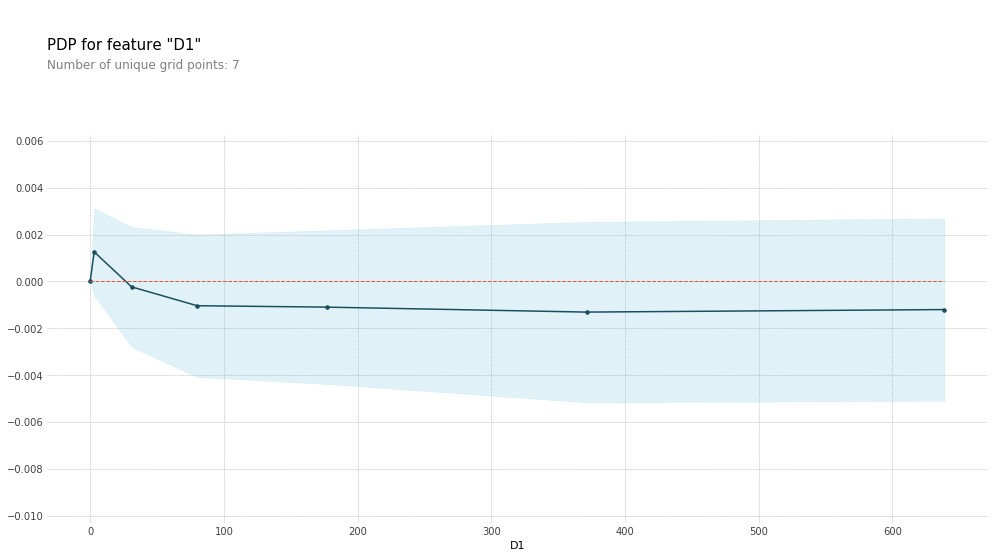

In [92]:
# Create the data and plot it 
pdp_d1 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D1')

# plot it 
pdp.pdp_plot(pdp_d1, 'D1') 
plt.show()

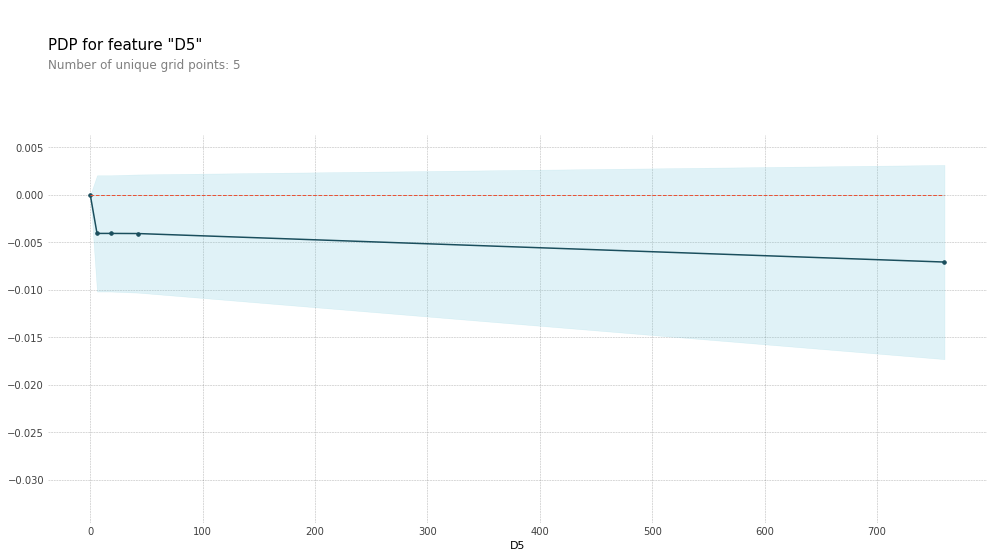

In [93]:
# Create the data that we will plot
pdp_d5 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D5')

# plot it
pdp.pdp_plot(pdp_d5, 'D5')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D5 between 1-10 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions

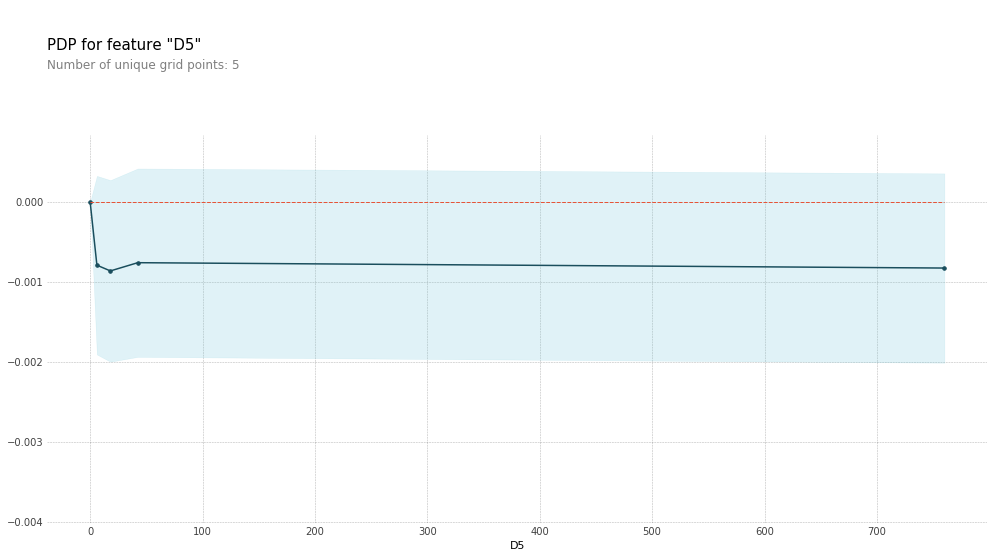

In [94]:
# Create the data and plot it
pdp_d5 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D5')
pdp.pdp_plot(pdp_d5, 'D5')
plt.show()

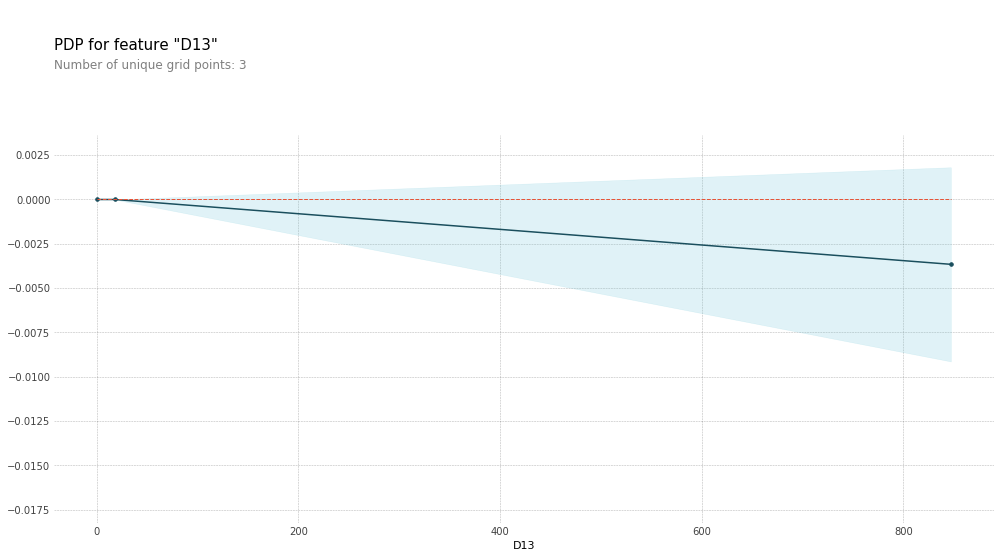

In [95]:
# Create the data that we will plot
pdp_d13 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D13')

# plot it
pdp.pdp_plot(pdp_d13, 'D13')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that D13 between 1-20 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions

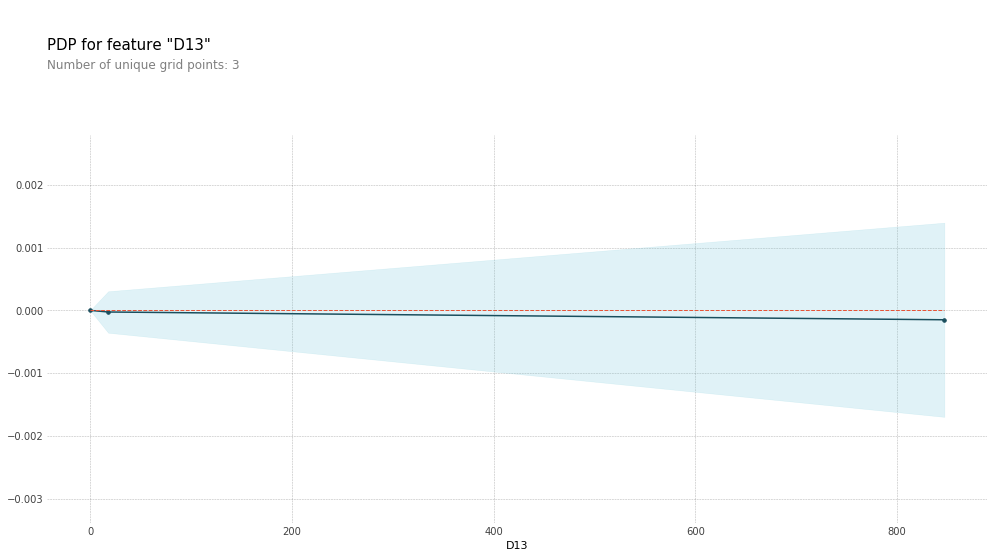

In [96]:
# Create the data and plot it
pdp_d13 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='D13')
pdp.pdp_plot(pdp_d13, 'D13')
plt.show()

### ---> Card Features

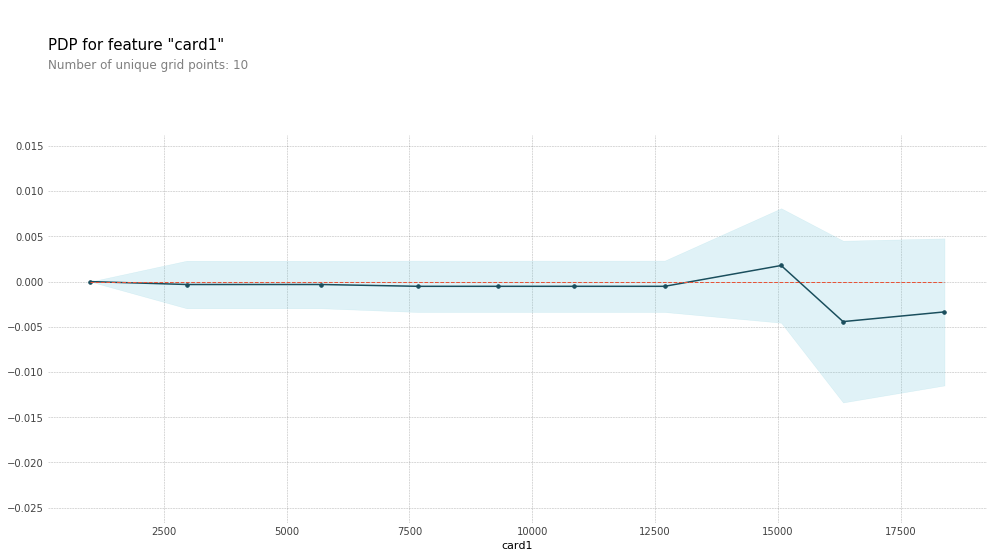

In [97]:
# Create the data that we will plot
pdp_card1 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card1')

# plot it
pdp.pdp_plot(pdp_card1, 'card1')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that card1 between 13000-15000 dramaticly increases the chances of existence of Fraud. But between 15000-16000 it's dramaticly decreases the chances of existence of Fraud. Extra transactions beyond 16000 appear to have little impact on predictions

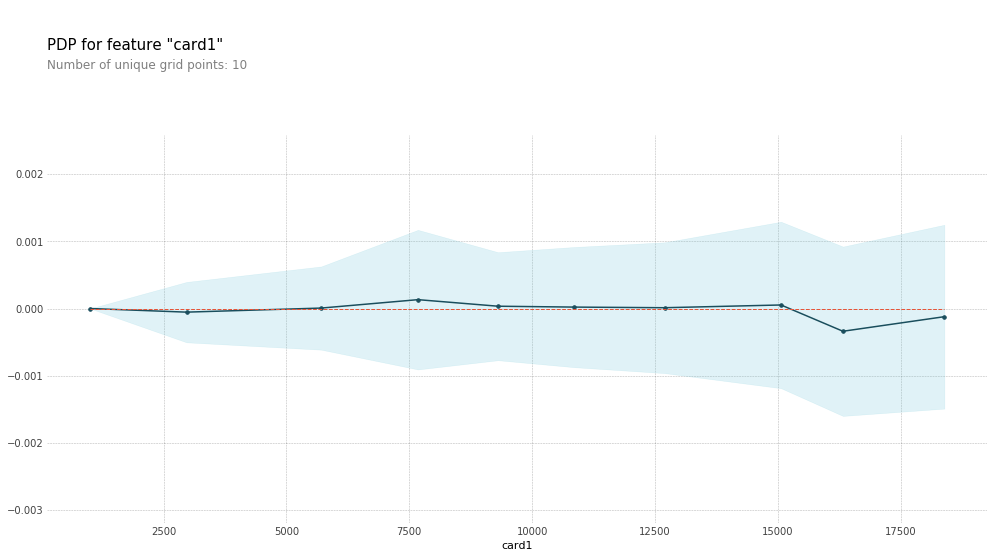

In [98]:
# Create the data and plot it
pdp_card1 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card1')
pdp.pdp_plot(pdp_card1, 'card1')
plt.show()

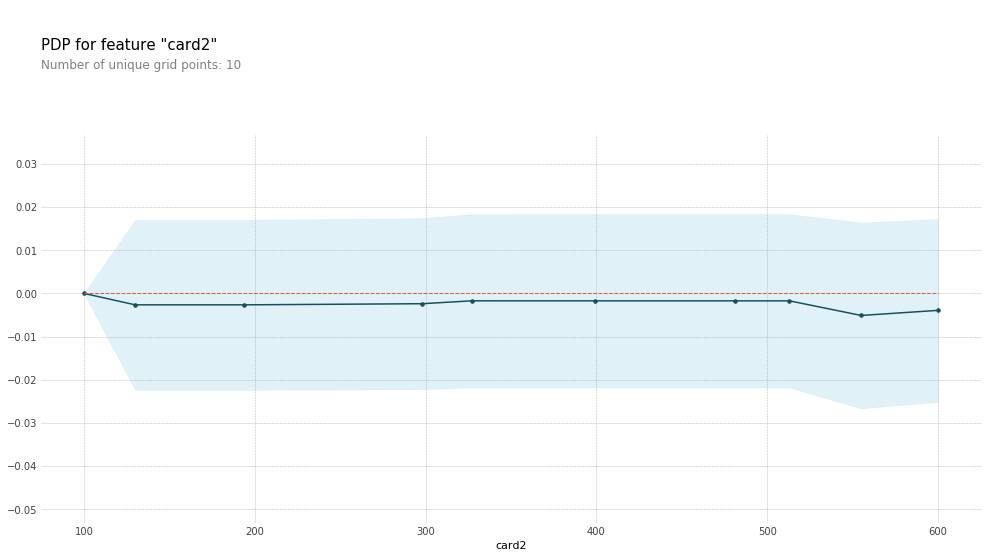

In [99]:
# Create the data that we will plot
pdp_card2 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card2')

# plot it
pdp.pdp_plot(pdp_card2, 'card2')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, we can see that card2 between 520-570 dramaticly decreases the chances of existence of Fraud, then between 570-600 it's dramaticly increases the chances of existence of Fraud. Still Fraud prediction is bellow 0.

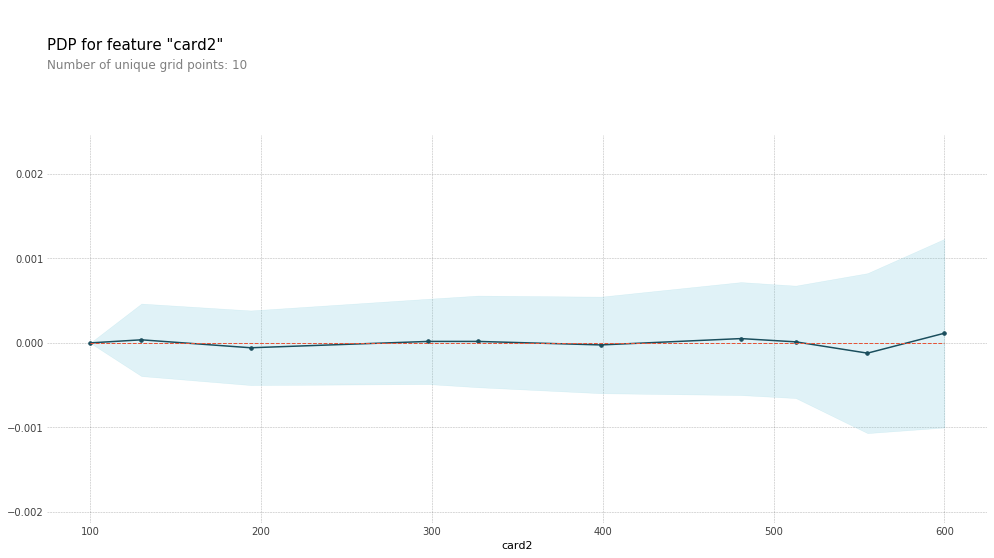

In [100]:
# Create the data and plot it
pdp_card2 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card2')
pdp.pdp_plot(pdp_card2, 'card2')
plt.show()

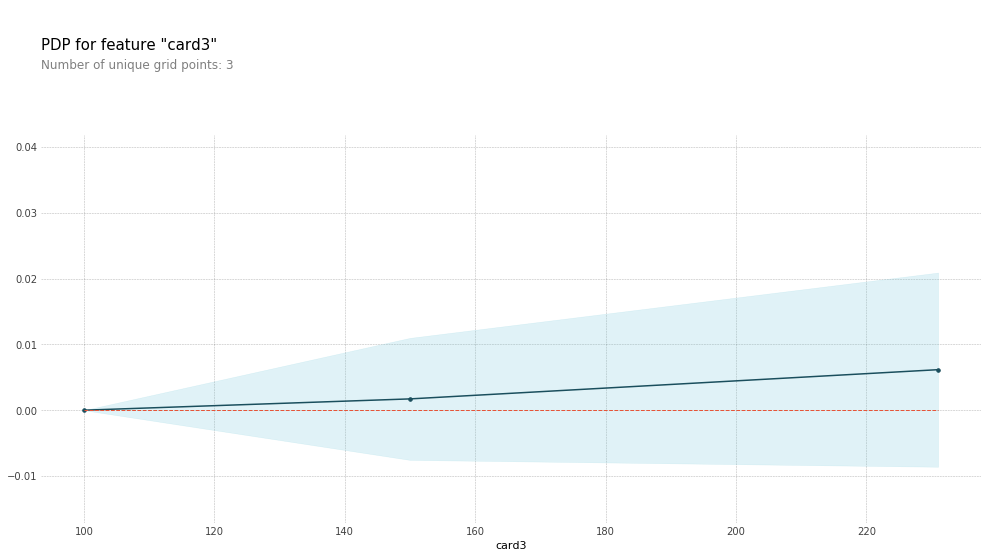

In [101]:
# Create the data that we will plot
pdp_card3 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card3')

# plot it
pdp.pdp_plot(pdp_card3, 'card3')
plt.show()

#### From the graphs on both XGBoost and LightGBM models, card3 is constantly increasing from 150 to 250. But since it does not correspond to TransactionAmt graph, means it does not significantly influence on predictions and does not influence on existence of Fraud. Therefore, we will exclude this feature for further analysis.

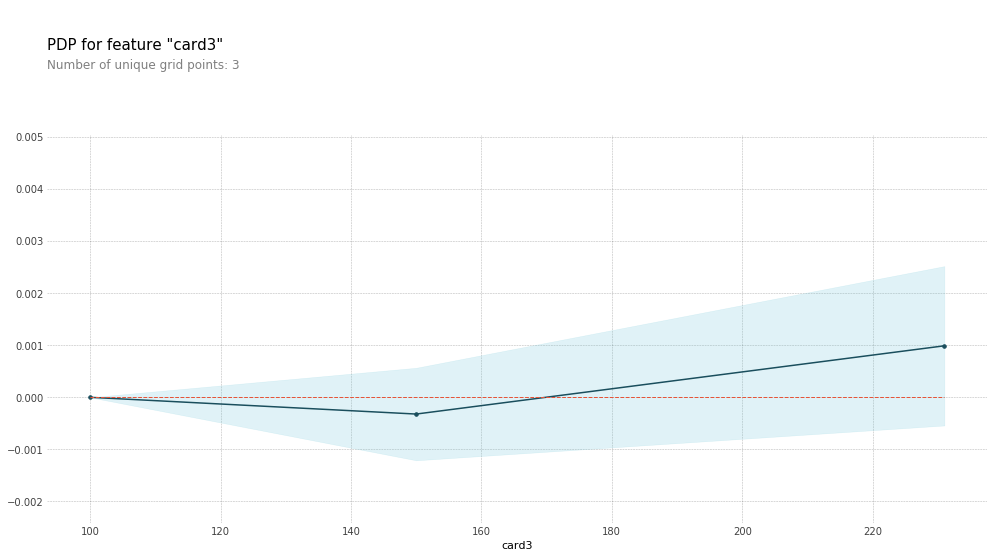

In [102]:
# Create the data and plot it
pdp_card3 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card3')
pdp.pdp_plot(pdp_card3, 'card3')
plt.show()

## Categorical Features

In [103]:
data.card6.unique() #Check above ''credit', 'debit', 'debit or credit', 'charge card'

array([1, 2, 3, 0])

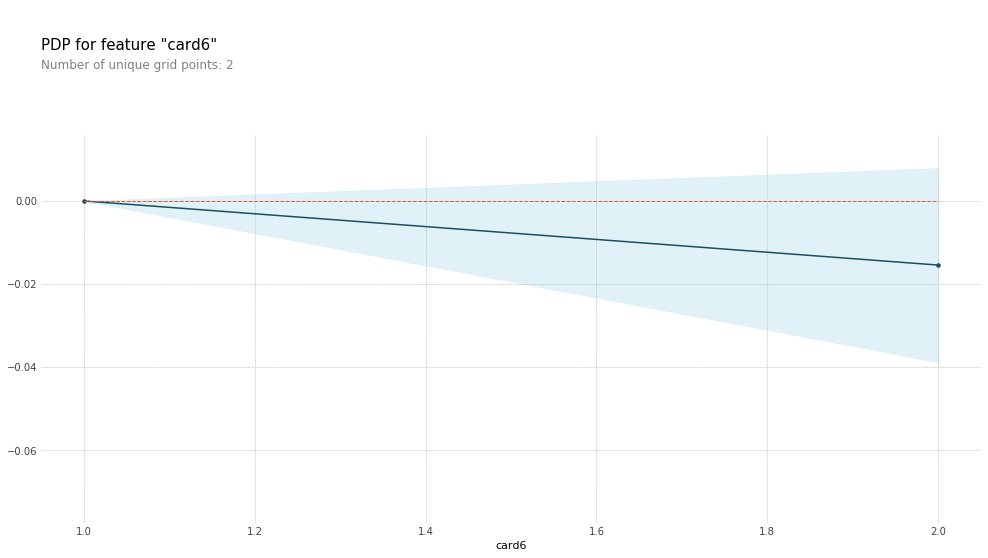

In [104]:
# Create the data and plot it
pdp_card6 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card6')
pdp.pdp_plot(pdp_card6, 'card6')
plt.show()

#### For both models we can see that the lowest Fraud is detected in card6 at 2, which is corresponding to 'debit' option.

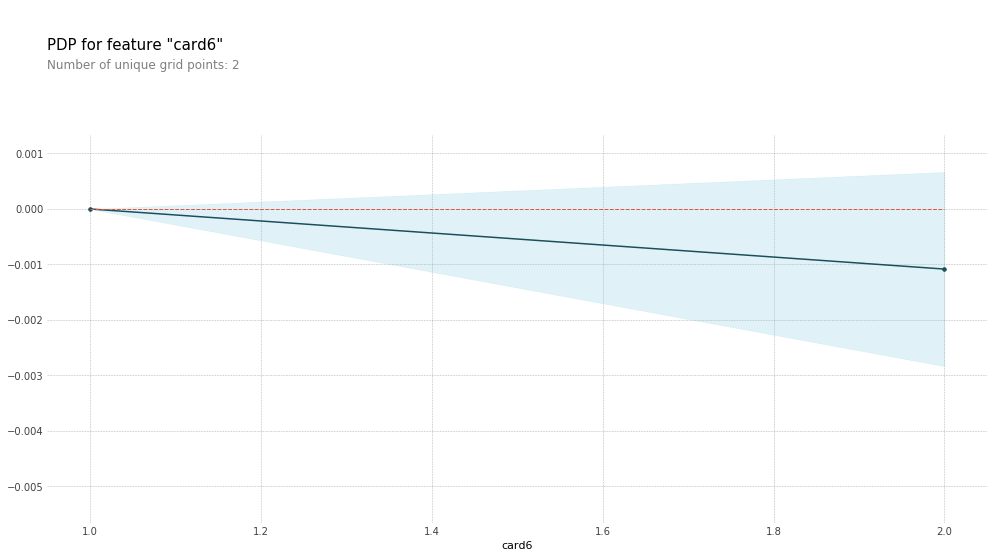

In [105]:
# Create the data and plot it
pdp_card6 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='card6')
pdp.pdp_plot(pdp_card6, 'card6')
plt.show()

In [106]:
data.M5.unique() # Check above 'F', 'T'

array([0, 1])

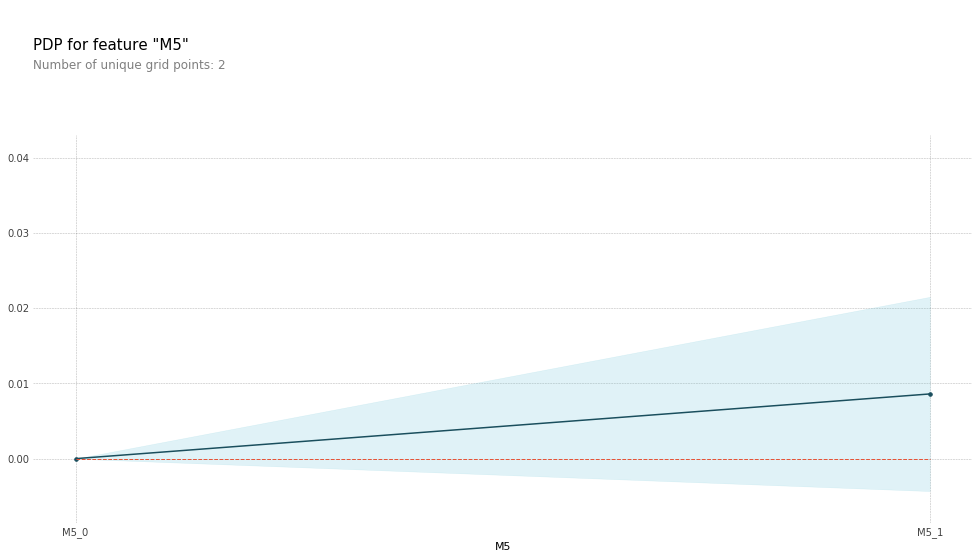

In [107]:
# Create the data and plot it
pdp_m5 = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='M5')
pdp.pdp_plot(pdp_m5, 'M5')
plt.show()

#### For both models we can see that the highest Fraud is detected for M5 at 1, which is corresponding to 'T' option.

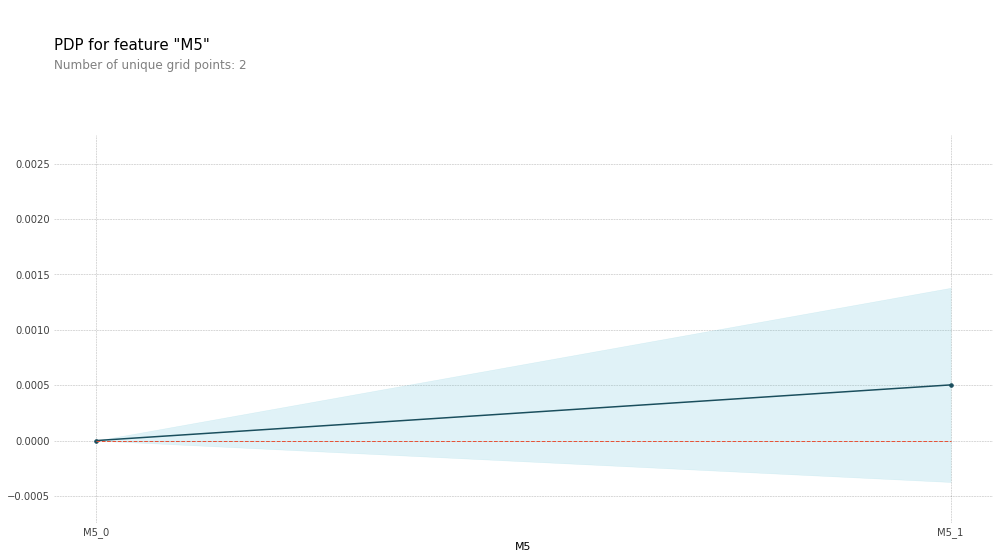

In [108]:
# Create the data and plot it
pdp_m5 = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='M5')
pdp.pdp_plot(pdp_m5, 'M5')
plt.show()

In [109]:
data.P_emaildomain.unique()

array([16, 35, 53, 29,  1, 19, 48,  2, 30,  9, 34, 10,  8, 42, 37, 12, 23,
       26, 15, 25,  3, 24, 58, 43,  4, 31, 40, 54,  6, 45, 11, 21,  7, 41,
       33, 17, 46, 14, 50, 13, 36, 28, 32,  0, 49, 47,  5, 57, 55, 56, 44,
       39, 27, 52, 22, 20, 18, 38, 51])

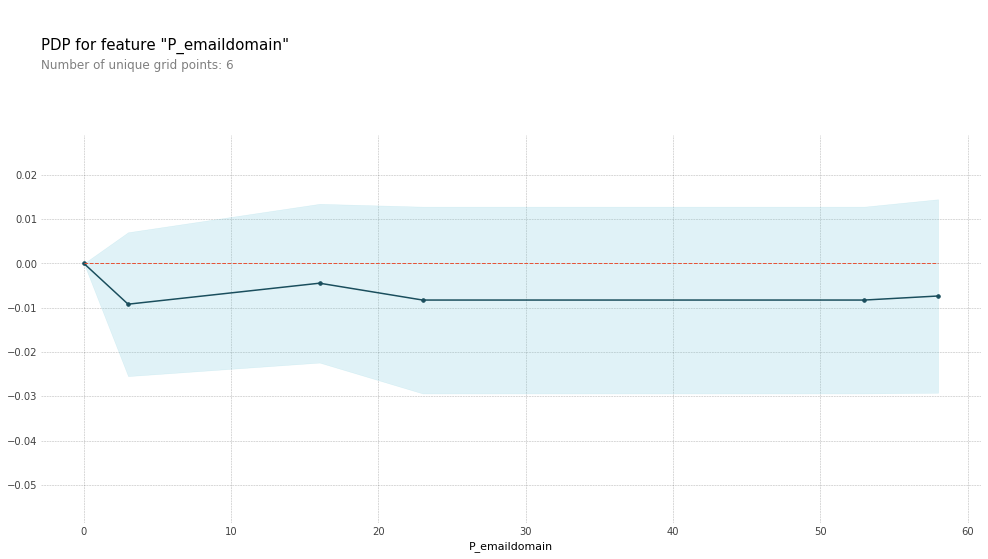

In [110]:
# Create the data and plot it
pdp_pemail = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='P_emaildomain')
pdp.pdp_plot(pdp_pemail, 'P_emaildomain')
plt.show()

#### For XGB model we can see that the lowest Fraud prediction is at 3 which is corresponding to 'att.net' option. But for LGB model we can see the highest Fraud is detected at 16 which is corresponding to gmail.com. It means highest Fraud is detected in P Email Domain particularly registered with gmail email addresses.¶

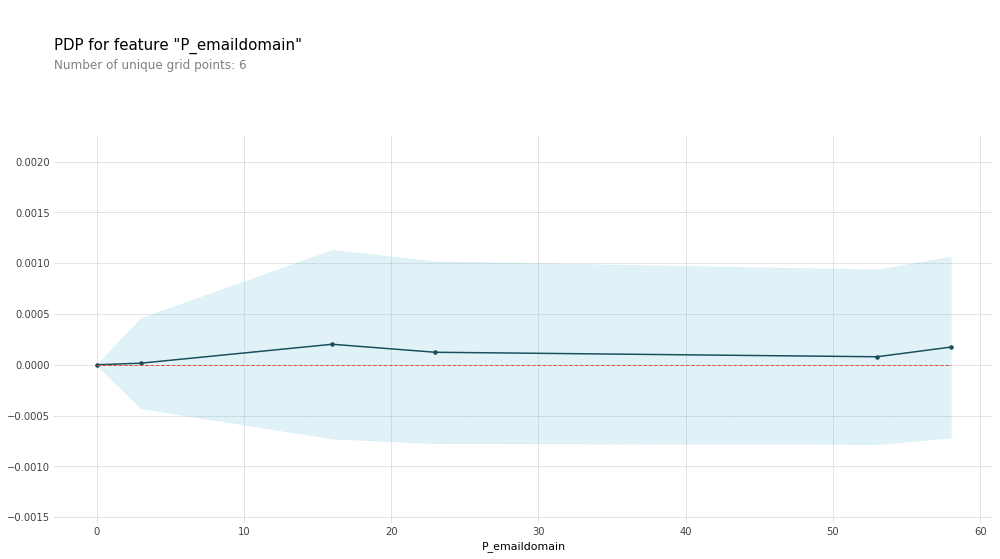

In [111]:
# Create the data and plot it
pdp_pemail = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='P_emaildomain')
pdp.pdp_plot(pdp_pemail, 'P_emaildomain')
plt.show()

In [112]:
data.R_emaildomain.unique()

array([16, 19, 35,  1,  8, 37,  9, 26, 23, 54,  2, 24,  3, 49, 55,  4, 46,
       59, 21, 31, 34, 25, 17,  0, 29, 30, 36, 10, 11, 12, 50, 43, 45, 28,
       48, 41, 58, 56, 57, 14, 15, 27, 40, 53, 51, 47, 22, 39, 20, 13,  7,
       18, 32, 33, 52, 42,  6, 38,  5, 44])

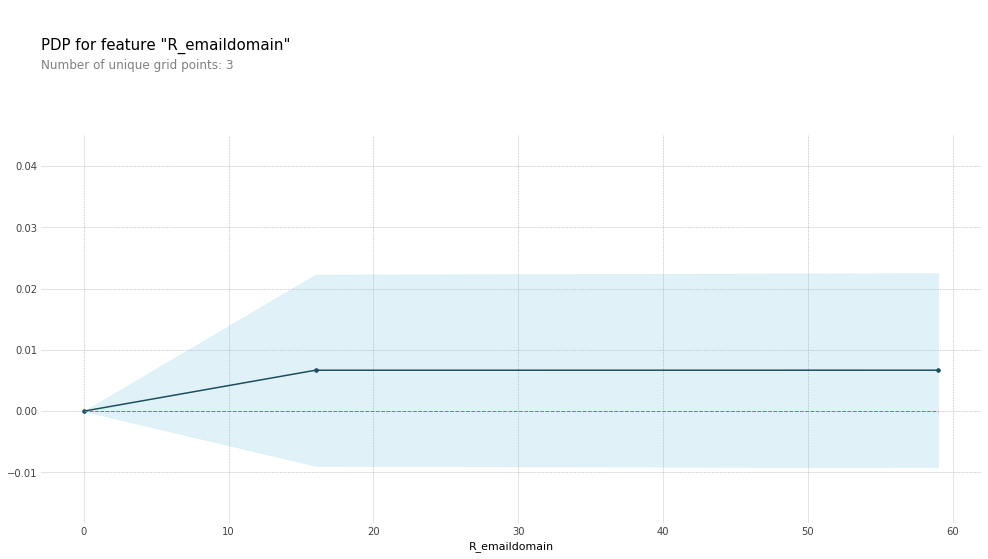

In [113]:
# Create the data and plot it
pdp_remail = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='R_emaildomain')
pdp.pdp_plot(pdp_remail, 'R_emaildomain')
plt.show()

#### For both models we see that highest Fraud prediction correspond to 16, which is 'gmail.com'. It means highest Fraud is detected in R Email Domain particularly registered with gmail email addresses.

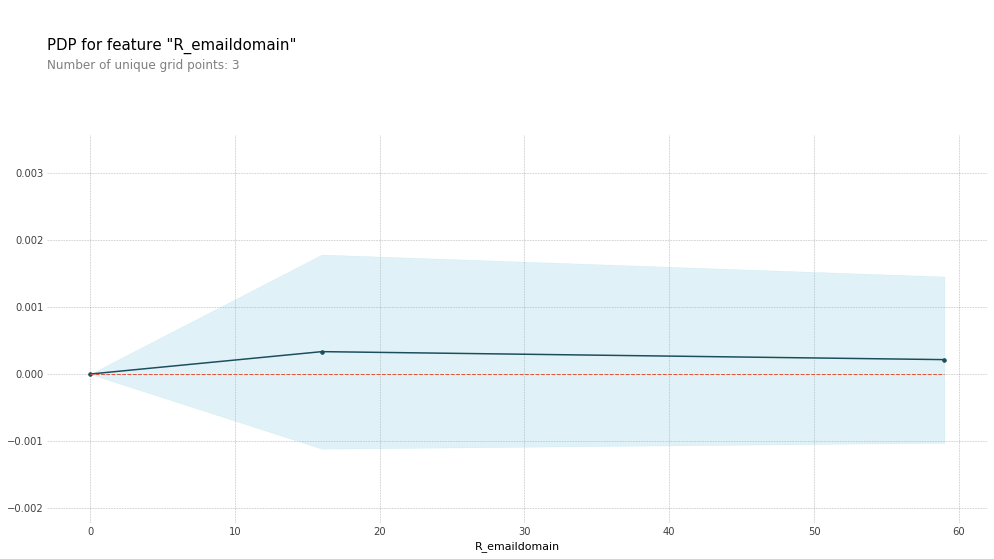

In [114]:
# Create the data and plot it
pdp_remail = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='R_emaildomain')
pdp.pdp_plot(pdp_remail, 'R_emaildomain')
plt.show()

In [115]:
data.DeviceType.unique() #'desktop', 'mobile'

array([0, 1])

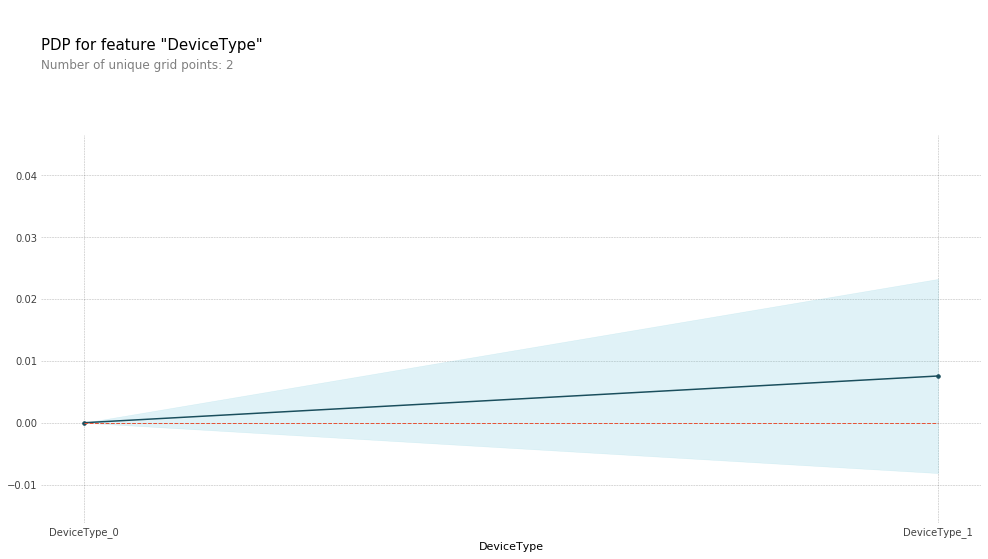

In [116]:
# Create the data and plot it
pdp_devicetype = pdp.pdp_isolate(model=xgb_model, dataset=X_test, model_features=list(X_test.columns), feature='DeviceType')
pdp.pdp_plot(pdp_devicetype, 'DeviceType')
plt.show()

#### For both models we can see that the highest Fraud is detected for DeviceType on mobiles.

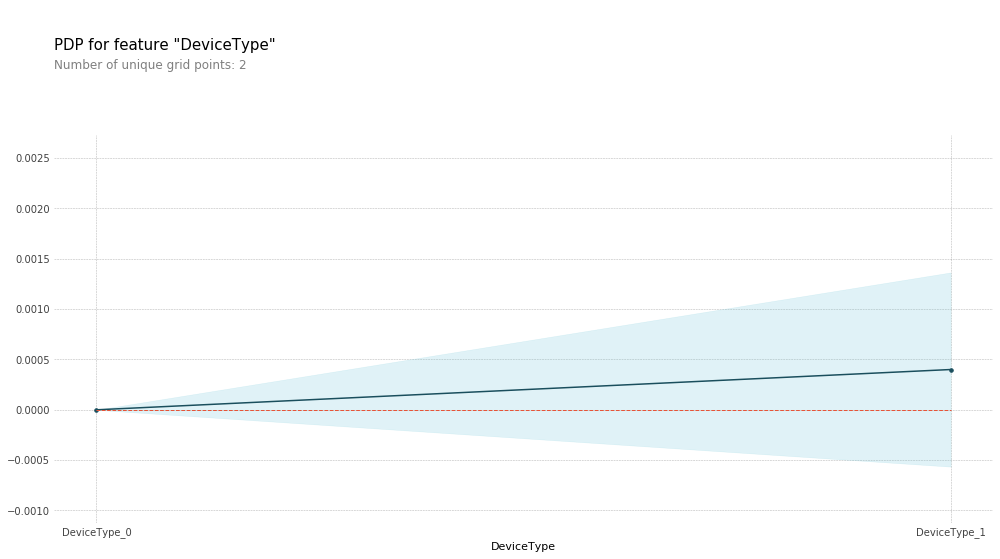

In [117]:
# Create the data and plot it
pdp_devicetype = pdp.pdp_isolate(model=lgb_model, dataset=X_test, model_features=list(X_test.columns), feature='DeviceType')
pdp.pdp_plot(pdp_devicetype, 'DeviceType')
plt.show()

#### According to our PDP plots we can see there are positive correlations between Transaction Amount and C1, C2, C6, C9, C11, furthermore we can clearely see that the best correlation is particularly with C9 feature. All other features showed either negative or no significant correlations with Fraud predictions.

## Model Interpretation with Skater library

#### Skater performs Interpretation for various models to help building an Interpretable machine learning system often needed for real world use-cases using a model-agnostic approach. It is designed to demystify the learned structures of a black box model both globally and locally.

### Feature Importances with Skater

In [118]:
#Build an interpretation object
interpreter = Interpretation(training_data=X_test, training_labels=y_test, feature_names=list(X_test.columns))

#Build an in-memory model
im_model = InMemoryModel(xgb_model.predict_proba, examples=X_train, target_names=['Normal', 'Fraud'])

#### The skater feature importance is measuring the entropy in the change of predictions, given a perturbation of a given feature. The more a model’s decision criteria depend on a feature, the more we’ll see predictions change as a function of perturbing a feature. The default method used is prediction-variance which is the mean absolute value of changes in predictions, given perturbations in the data.

2020-01-14 10:02:41,372 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False
2020-01-14 10:02:44,744 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[50/50] features ████████████████████ Time elapsed: 23 seconds

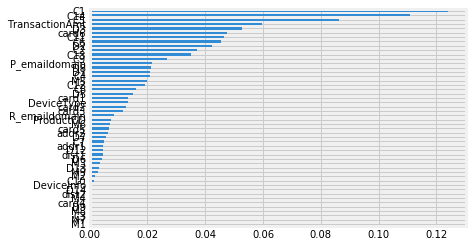

In [119]:
plots = interpreter.feature_importance.plot_feature_importance(im_model, ascending=True, n_jobs=1)

**In this graph among of top Non Categorical Features there are C14, C1,TransactionAmt, C13, C5, C9, C6, C2.**

### Partial Dependence Plots of XGBoost model with Skater library

2020-01-14 10:03:10,144 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:10,146 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[42/42] grid cells ████████████████████ Time elapsed: 3 seconds

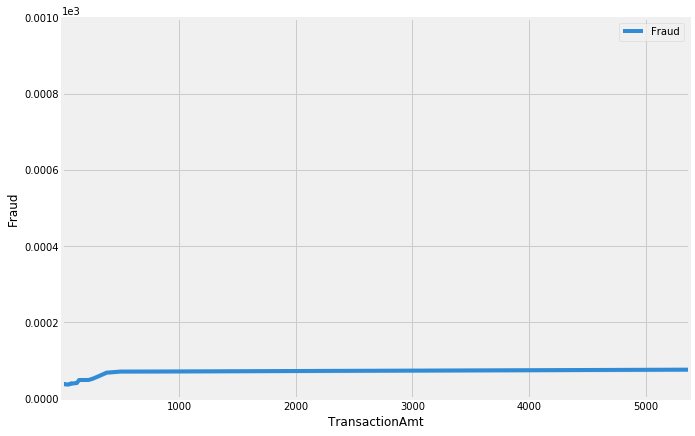

In [120]:
r = interpreter.partial_dependence.plot_partial_dependence(['TransactionAmt'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1) 

#### On this graph we can see that Transaction Amount between 1-250 substantially increases the chances of existence of Fraud. But extra transactions beyond that appear to have little impact on predictions.

2020-01-14 10:03:19,566 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:19,567 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[10/10] grid cells ████████████████████ Time elapsed: 0 seconds

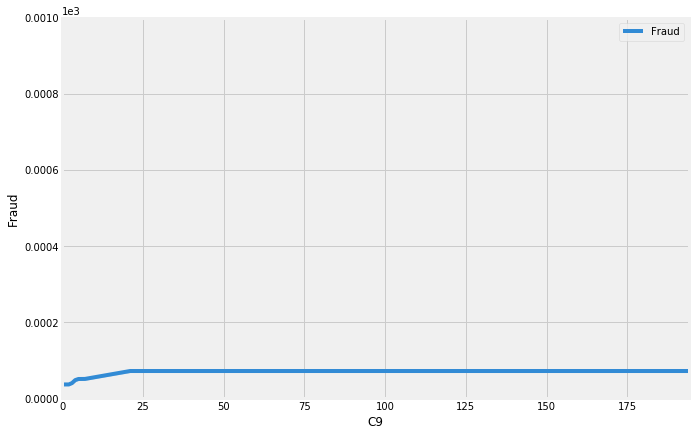

In [121]:
r = interpreter.partial_dependence.plot_partial_dependence(['C9'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1) 

#### From this graph we can see that C9 between 1-20 substantially increases the chances of existence of Fraud. Extra transactions beyond that appear to give some increasing impact on predictions.

2020-01-14 10:03:25,774 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:25,775 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[12/12] grid cells ████████████████████ Time elapsed: 1 seconds

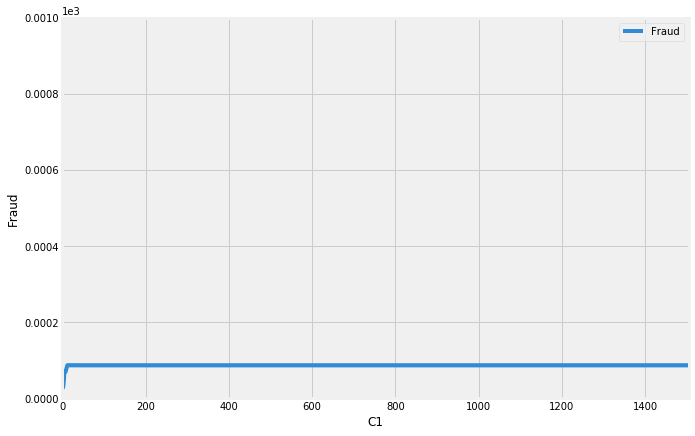

In [122]:
r = interpreter.partial_dependence.plot_partial_dependence(['C1'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1)

#### From this graph we can see that C1 between 1-5 substantially increases the chances of existence of Fraud. Extra transactions beyond that appear to give some increasing impact on predictions.

2020-01-14 10:03:32,467 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:32,468 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[13/13] grid cells ████████████████████ Time elapsed: 1 seconds

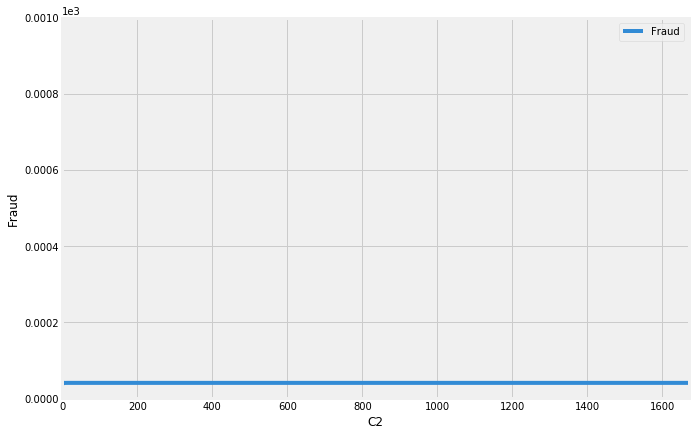

In [123]:
r = interpreter.partial_dependence.plot_partial_dependence(['C2'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1)

#### From this graph we can see that C2 does not influence on of existence of Fraud. 

2020-01-14 10:03:38,722 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:38,724 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[11/11] grid cells ████████████████████ Time elapsed: 0 seconds

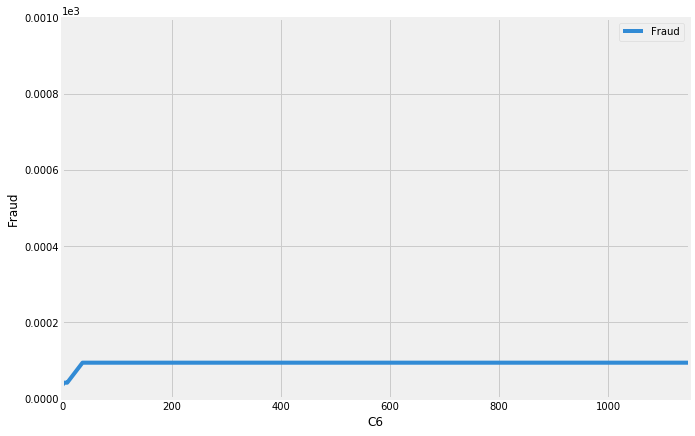

In [124]:
r = interpreter.partial_dependence.plot_partial_dependence(['C6'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1)

#### From this graph we can see that C6 between 1-50 dramatically increases the chances of existence of Fraud. Extra transactions beyond that appear to give some increasing impact on predictions.

2020-01-14 10:03:44,765 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:44,766 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[10/10] grid cells ████████████████████ Time elapsed: 0 seconds

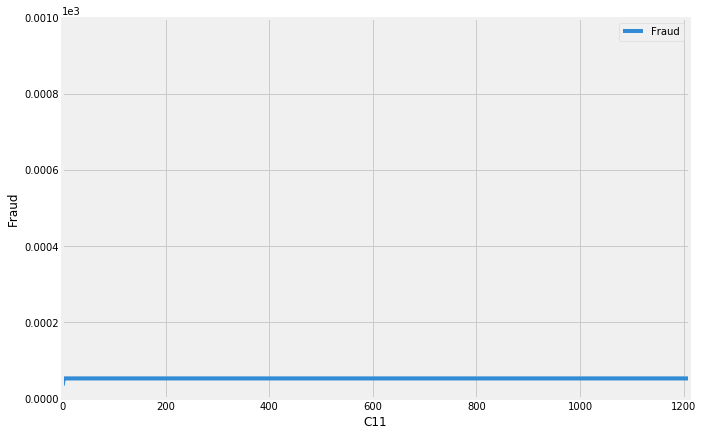

In [125]:
r = interpreter.partial_dependence.plot_partial_dependence(['C11'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1)

#### From this graph we can see that C11 between 1-5 increases the chances of existence of Fraud. Extra transactions beyond that appear to give some increasing impact on predictions.¶

2020-01-14 10:03:50,615 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:50,617 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[27/27] grid cells ████████████████████ Time elapsed: 2 seconds

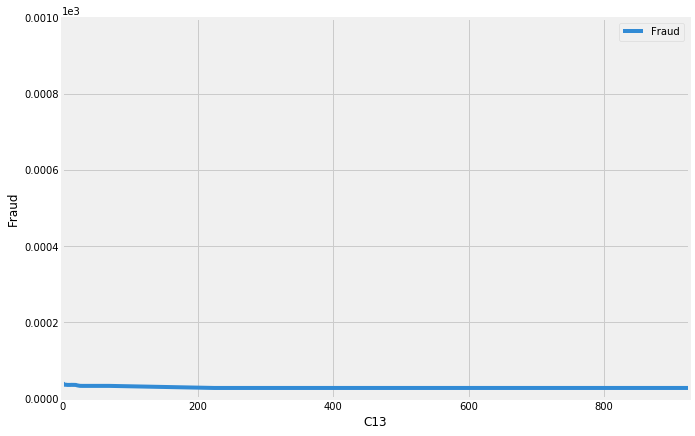

In [126]:
r = interpreter.partial_dependence.plot_partial_dependence(['C13'], im_model, grid_resolution=50, 
                                                n_jobs=1, grid_range=(0,1), with_variance=True, figsize = (10, 7))
yl = r[0][1].set_ylim(0, 1)

#### From this graph we can see that  C13 between 1-50 dramaticly decreases the chances of existence of Fraud. Extra transactions beyond that appear to have little impact on predictions

#### Above we have described Partial Dependence Plots with PDPbox library. If we compare Partial Dependence Plots of XGBoost model on Skater and PDPbox libraries, we can see that results are the same but plots with PDPbox are much easier to read and explain. Therefore, PDPbox library is recommended for Partial Dependence Plots.

### PDP showing interactions between 2 features and their effect on Fraud

2020-01-14 10:03:57,882 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:03:57,884 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[1064/1064] grid cells ████████████████████ Time elapsed: 174 seconds

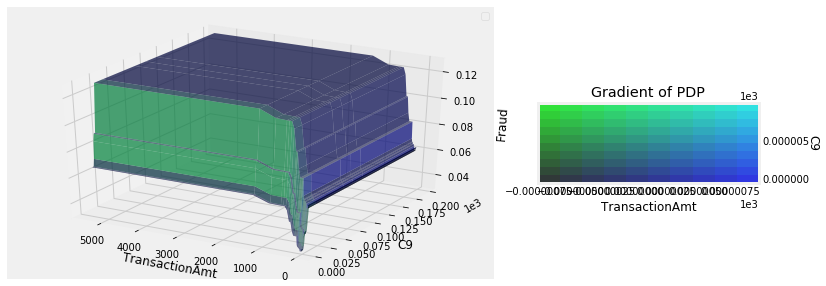

In [127]:
# Positive correlation

plots_list = interpreter.partial_dependence.plot_partial_dependence([('TransactionAmt', 'C9')], 
                                                                    im_model, grid_range=(0,1), 
                                                                    figsize=(12, 5), n_jobs=1,
                                                                    grid_resolution=100)

#### On this 3D graph we can see that increase of TransactionAmt and C9 increases the chances of existence of Fraud

2020-01-14 10:06:58,497 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:06:58,498 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[1292/1292] grid cells ████████████████████ Time elapsed: 202 seconds

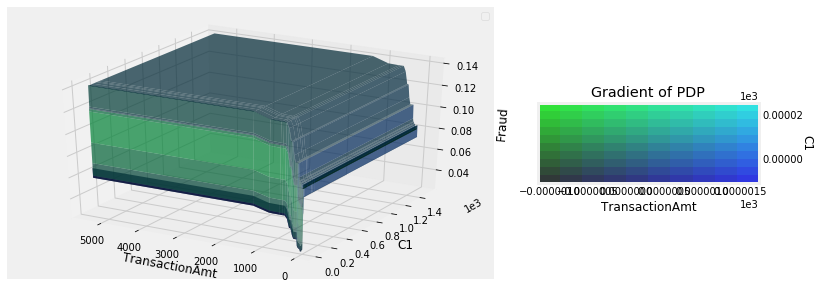

In [128]:
# Positive correlation

plots_list = interpreter.partial_dependence.plot_partial_dependence([('TransactionAmt', 'C1')], 
                                                                    im_model, grid_range=(0,1), 
                                                                    figsize=(12, 5), n_jobs=1,
                                                                    grid_resolution=100)

#### On this 3D graph we can see that increase of TransactionAmt and C1 increases the chances of existence of Fraud

2020-01-14 10:10:27,412 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:10:27,413 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[1368/1368] grid cells ████████████████████ Time elapsed: 225 seconds

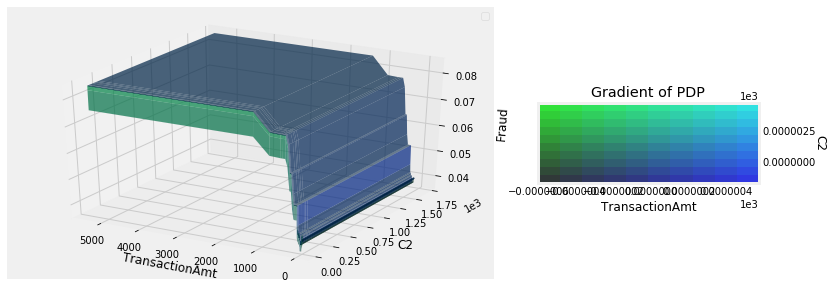

In [129]:
# Positive correlation

plots_list = interpreter.partial_dependence.plot_partial_dependence([('TransactionAmt', 'C2')], 
                                                                    im_model, grid_range=(0,1), 
                                                                    figsize=(12, 5), n_jobs=1,
                                                                    grid_resolution=100)

#### On this 3D graph we can see that increase of TransactionAmt and C2 increases the chances of existence of Fraud

2020-01-14 10:14:19,130 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:14:19,131 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[1140/1140] grid cells ████████████████████ Time elapsed: 187 seconds

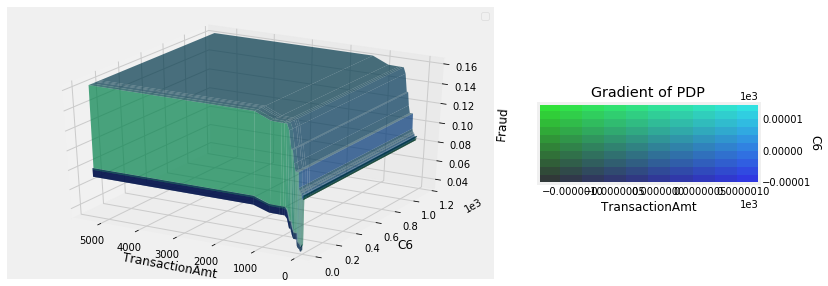

In [130]:
# Positive correlation

plots_list = interpreter.partial_dependence.plot_partial_dependence([('TransactionAmt', 'C6')], 
                                                                    im_model, grid_range=(0,1), 
                                                                    figsize=(12, 5), n_jobs=1,
                                                                    grid_resolution=100)

#### On this 3D graph we can see that increase of TransactionAmt and C6 increases the chances of existence of Fraud

2020-01-14 10:17:33,153 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:17:33,155 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[1064/1064] grid cells ████████████████████ Time elapsed: 170 seconds

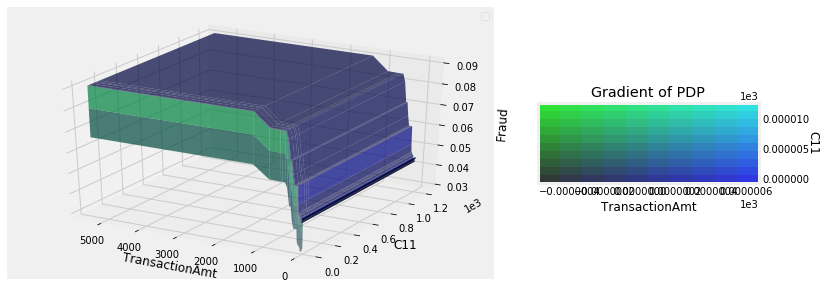

In [131]:
# Positive correlation

plots_list = interpreter.partial_dependence.plot_partial_dependence([('TransactionAmt', 'C11')], 
                                                                    im_model, grid_range=(0,1), 
                                                                    figsize=(12, 5), n_jobs=1,
                                                                    grid_resolution=100)

#### On this 3D graph we can see that increase of TransactionAmt and C11 increases the chances of existence of Fraud

2020-01-14 10:20:29,009 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False
2020-01-14 10:20:29,010 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


[3040/3040] grid cells ████████████████████ Time elapsed: 479 seconds

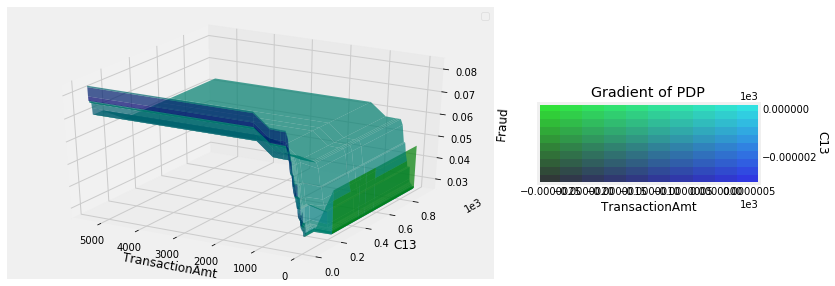

In [132]:
#Negative correlation

plots_list = interpreter.partial_dependence.plot_partial_dependence([('TransactionAmt', 'C13')], 
                                                                    im_model, grid_range=(0,1), 
                                                                    figsize=(12, 5), n_jobs=1,
                                                                    grid_resolution=100)

#### On this 3D graph we can see that increase of TransactionAmt and decrease of C13 increases the chances of existence of Fraud

#### All positive interactions with Transaction amount show the same plot, particularly we can see a clear interaction of TransactionAmt and C9 features and their effect on Fraud. The last plot's example is provided to show a negative interaction of TransactionAmt and C13.

## Local Interpretable Model-Agnostic Explanations(LIME)

#### LIME is designed to explain the behavior of any base model using interpretable surrogate models which are learned on the predictions of the original black box model. But instead of trying to fit a global surrogate model, LIME is fitting local surrogate models to explain why single predictions were made. It explains what happens to black box model’s predictions when you feed variations of dataset into the black box. 

In [133]:
# creating the explainer function
explainer = lime.lime_tabular.LimeTabularExplainer(X_train[lgb_model.feature_name()].astype(int).values,  
mode='classification',training_labels=y_train,feature_names=lgb_model.feature_name())

In [134]:
def prob(X_train):
    return np.array(list(zip(1-lgb_model.predict(X_train),lgb_model.predict(X_train))))

In [135]:
# Explanation using the LGB model (Normal-0, Fraud-1)
i = 1
exp = explainer.explain_instance(X_train.loc[i, features].astype(int).values, prob, num_features=5)
exp.show_in_notebook(show_table=True) 

In [136]:
rf = RandomForestClassifier().fit(X_train, y_train)
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=X_train.columns.values, class_names=rf.classes_, discretize_continuous=True)

exp = explainer.explain_instance(X_test.iloc[0], rf.predict_proba)
exp.show_in_notebook(show_table=True)

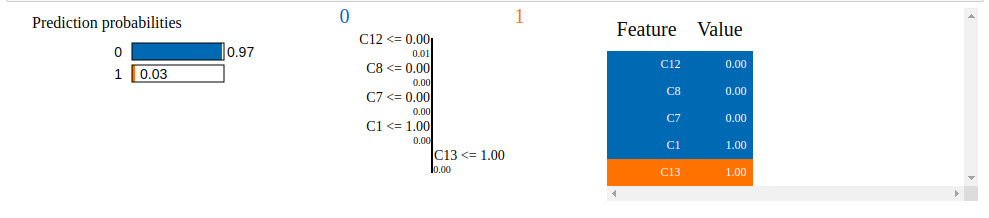

In [137]:
from IPython.display import Image
Image("../data/LIME.png")

#### With LIME is possible to explain for single predictions and check how did the feature values of a single data point affect its prediction. We can see in this graph that prediction probability for Fraud is 3% and C13 is the most influential in the model prediction. 

## Model Interpretation with SHAP

####  SHapley Additive exPlanation (SHAP) helps to break down a prediction to show the impact of each feature. It is based on Shapley values, a technique used in game theory to determine how much each player in a collaborative game has contributed to its success. Normally, getting the trade-off between accuracy and interpretability just right can be a difficult balancing act but SHAP values can deliver both.

#### We use the Tree SHAP implementation integrated into XGBoost to explain the test dataset.

In [138]:
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test)
print('Expected Value:', explainer.expected_value)
pd.DataFrame(shap_values).head()

Expected Value: -3.493219


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-0.176119,0.002855,0.045459,0.009735,-0.039528,-0.000217,-0.033339,0.435864,-0.011472,-0.003787,...,-0.002566,-0.005047,-0.001830,-0.076461,0.011847,0.0,0.0,-0.004347,-0.037944,-0.001370
1,-0.181469,0.002675,-0.092785,0.019273,-0.052423,-0.001646,0.016294,-0.179022,-0.007331,-0.003787,...,-0.001119,-0.006573,-0.000093,-0.060194,-0.068944,0.0,0.0,-0.004347,-0.024274,-0.001624
2,0.185365,-0.018553,0.020780,0.020764,-0.018369,-0.000217,0.014880,-0.046890,0.001505,-0.003636,...,-0.002566,-0.003308,0.002022,-0.051236,0.024525,0.0,0.0,-0.004347,-0.044654,-0.001370
3,0.056499,0.042358,0.023143,-0.126936,-0.189709,-0.000217,-0.013207,-0.196948,-0.004867,0.012432,...,-0.002566,-0.002546,0.004295,-0.035148,0.019710,0.0,0.0,-0.004347,0.185890,-0.045958
4,-0.050866,-0.003876,0.022069,0.016743,-0.059134,-0.000217,0.048040,-0.190417,-0.001040,-0.003787,...,-0.002566,-0.001326,-0.000390,-0.065494,0.019710,0.0,0.0,-0.004347,-0.045841,-0.001624


### Predicting when there is Fraud

In [139]:
# Tree on XGBoost
explainerXGB = shap.TreeExplainer(xgb_model)
shap_values_XGB_test = explainerXGB.shap_values(X_test)
j = 0

In [140]:
#XGBoost SHAP
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test[j], X_test.iloc[[j]]) 

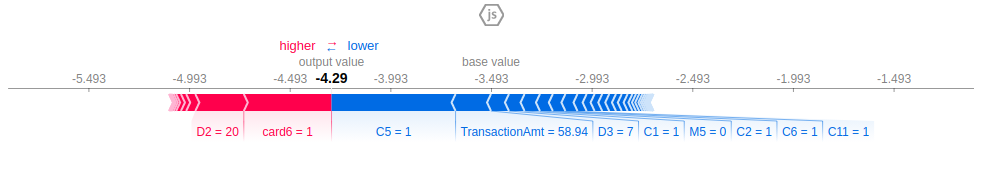

In [141]:
from IPython.display import Image
Image("../data/SHAP1.png")

#### We predicted -4.29, whereas the base_value is -3.493. Feature values causing increased predictions are in pink, and their visual size shows the magnitude of the feature's effect. Feature values decreasing the prediction are in blue. The biggest impact comes from card6 being 1. Though the C5 value being 1 has a meaningful effect decreasing the prediction.

### Visualizing and explaining multiple predictions

#### With SHAP it's possible to build interactive plots which can visualize and explain multiple predictions at once. Here we visualize model prediction decisions for the first 1000 test data samples.  Red SHAP values increase the prediction, blue values decrease it.

In [142]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_test.iloc[:1000,:])

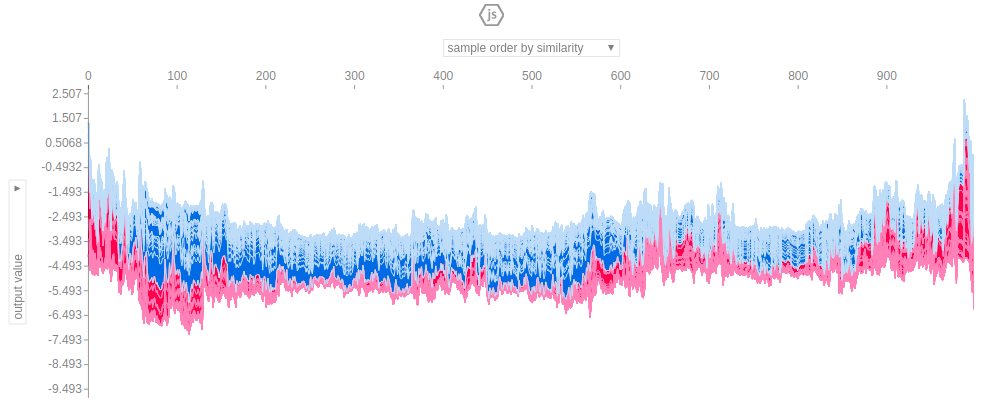

In [143]:
from IPython.display import Image
Image("../data/SHAP2.png")

**--The first 150+ test samples have hight Fraud** 

**--The next 400+ test samples almots don't have Fraud** 

**--The next 150+ test samples showing dramatic increase of Fraud**

**--The next 170+ test samples almots don't have Fraud**

**--The remaining 130+ test samples have hight Fraud**

### Feature Importances with SHAP

#### This feature importance takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

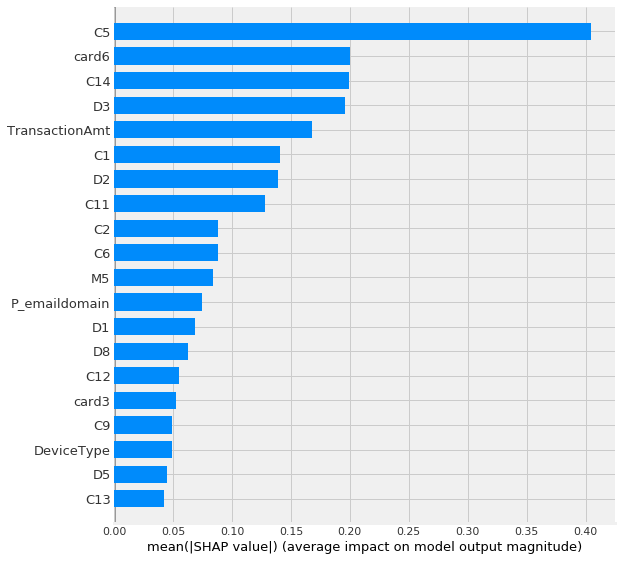

In [144]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

#### Top Non-Categorical Features are C5, C14, C9, D3, C1, TransactionAmt, C2, D5, C11, C12, C13, D4, D1, card3, C6, card1, C4.  Top Categorical features are card6, M5, R_emaildomain, DeviceType.

### SHAP Summary Plot

#### SHAP also enables to use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

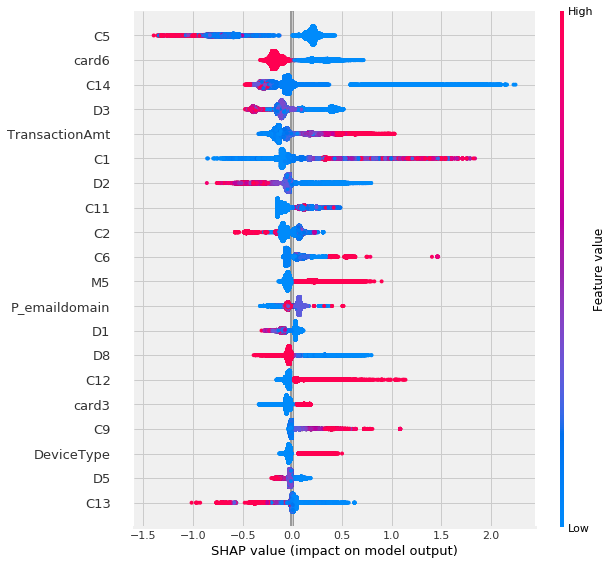

In [145]:
shap.summary_plot(shap_values, X_test)

**According to our plot we can see that C5, card6, C14, and D3 features have more total model impact than the TransactionAmt, but for those samples where TransactionAmt matters it has more impact than mentioned features. To say with simple words,TransactionAmt affects a few predictions by a large amount, while other features affects all predictions by a smaller amount.**

### SHAP Dependence Plots showing how PDP of the features are affecting model prediction

#### SHAP dependence plots show the effect of a single (or two) feature across the whole dataset. They plot a feature’s value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature can be chosen for coloring to highlight possible interactions.

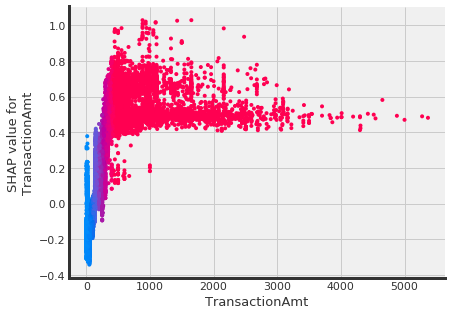

In [146]:
shap.dependence_plot(ind='TransactionAmt', interaction_index='TransactionAmt',shap_values=shap_values, 
                     features=X_test,  display_features=X_test)

#### Transaction amount around 250 has a higher shap value, pushing the model’s prediction decisions to say that in these ranges of transaction amount there is higher chance to have Fraud 

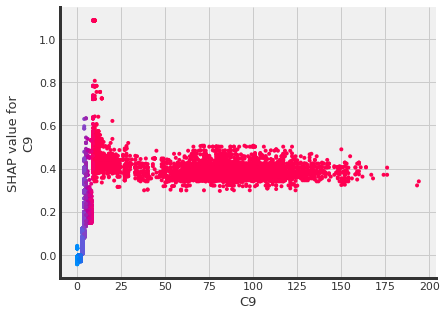

In [147]:
shap.dependence_plot(ind='C9', interaction_index='C9',shap_values=shap_values, 
                     features=X_test, display_features=X_test)

#### C9 around 5 has a higher shap value, pushing the model’s prediction decisions and in this range there is higher chance to have Fraud.

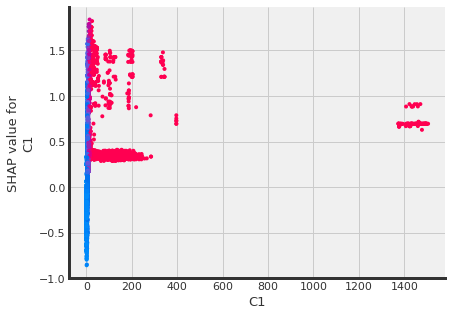

In [148]:
shap.dependence_plot(ind='C1', interaction_index='C1',shap_values=shap_values, 
                     features=X_test,  display_features=X_test)

#### C1 around 5 has a higher shap value, pushing the model’s prediction decisions and in this range there is higher chance to have Fraud

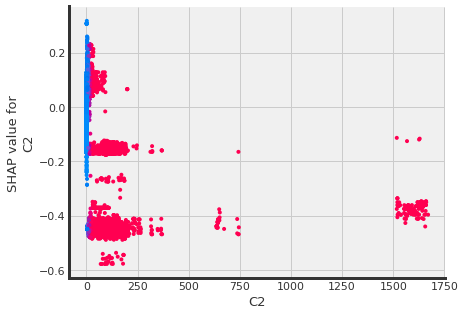

In [149]:
shap.dependence_plot(ind='C2', interaction_index='C2',shap_values=shap_values, 
                     features=X_test, display_features=X_test)

#### C2 around 5 has a higher shap value, pushing the model’s prediction decisions and in this range there is higher chance to have Fraud

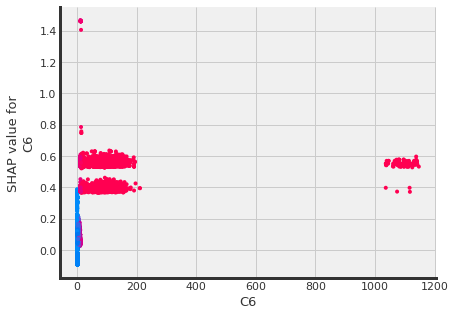

In [150]:
shap.dependence_plot(ind='C6', interaction_index='C6',shap_values=shap_values, 
                     features=X_test,  display_features=X_test)

#### C6 around 5 has a higher shap value, pushing the model’s prediction decisions and in this range there is higher chance to have Fraud

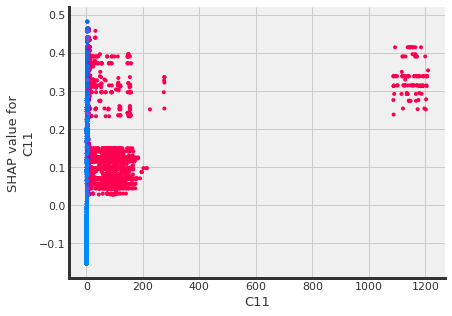

In [151]:
shap.dependence_plot(ind='C11', interaction_index='C11',shap_values=shap_values, 
                     features=X_test,  display_features=X_test)

#### C11 around 5 has a higher shap value, pushing the model’s prediction decisions and in this range there is higher chance to have Fraud

#### Among all dependence plots, we can see clearly that the closer plot to TransactionAmt is the plot of C9, therefore we will do another interaction plot between those two features and check their effect on Fraud.

### PDP showing interactions between two features and their effect on Fraud

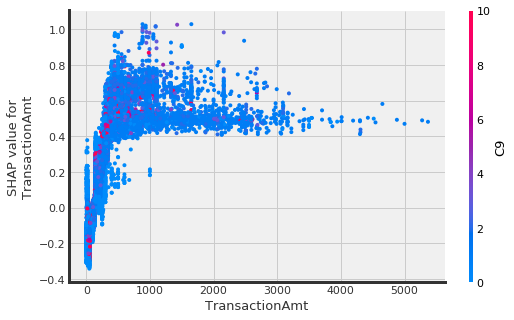

In [152]:
shap.dependence_plot(ind='TransactionAmt', interaction_index='C9', 
                     shap_values=shap_values, features=X_test, 
                     display_features=X_test)


#### Here we can see the higher C9 and TransactionAmt for around 250 having the highest chance of Fraud.

## The main differences between LIME and SHAP

**SHAP (SHapley Additive exPlanation) leverages the idea of Shapley values for model feature influence scoring. The technical definition of a Shapley value is the “average marginal contribution of a feature value over all possible coalitions.” In other words, Shapley values consider all possible predictions for an instance using all possible combinations of inputs. Because of this exhaustive approach, SHAP can guarantee properties like consistency and local accuracy.** 

**LIME (Local Interpretable Model-agnostic Explanations) builds sparse linear models around each prediction to explain how the black box model works in that local vicinity. SHAP show that Shapley values provide the only guarantee of accuracy and consistency and that LIME is actually a subset of SHAP but lacks the same properties.** 

**LIME is fast, while Shapley values take a long time to compute. The SHAP Python library helps with this compute problem by using approximations and optimizations to greatly speed things up while seeking to keep the nice Shapley properties. When you use a model with a SHAP optimization, things run very fast and the output is accurate and reliable.**

## Individual Conditional Expectation (ICE) 

#### Individual Conditional Expectation (ICE) plots display one line per instance that shows how the instance’s prediction changes when a feature changes. The partial dependence plot for the average effect of a feature is a global method because it does not focus on specific instances, but on an overall average. The equivalent to a PDP for individual data instances is called individual conditional expectation (ICE) plot. An ICE plot visualizes the dependence of the prediction on a feature for each instance separately, resulting in one line per instance, compared to one line overall in partial dependence plots. A PDP is the average of the lines of an ICE plot. Compared to PDP plots, ICE plots provide much more insight explaining Fraud deeply on particular examples and we can see how changes for a given feature impact the Fraud predictions. 

In [153]:
# we first need to impute the missing data
train_X_df = pd.DataFrame(X_train, columns=X_train.columns)

In [154]:
train_data=lgb.Dataset(X_train,label=y_train,feature_name=X_train.columns.tolist())

In [155]:
from datetime import *

num_round=50
start=datetime.now()
lgbm=lgb.train(lgb_params,train_data,num_round,feature_name=list(X_train.columns))
stop=datetime.now()


lgb_estimator = lgb.LGBMClassifier(boosting_type='gbdt',
                        # class_weight='balanced', #used only in multiclass training
                         #is_unbalance ='True'   #used in binary class training    
                         objective='binary',
                         n_jobs=-1, 
                         verbose=0)

lgb_model = lgb_estimator.fit(X=X_train, y=y_train)


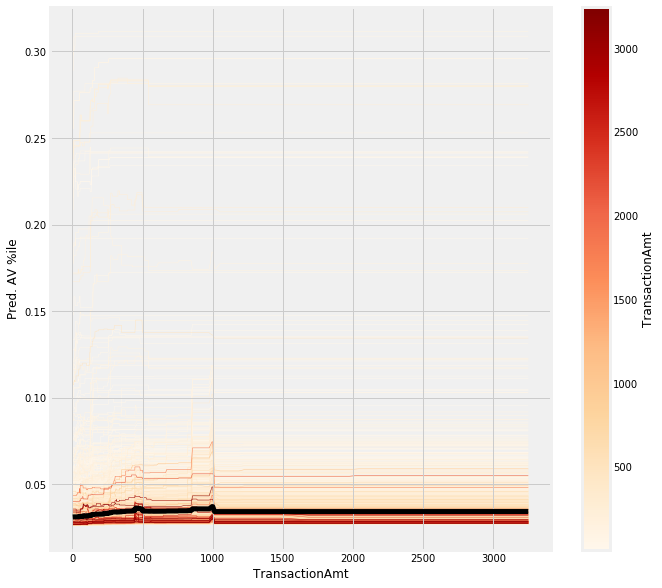

In [156]:
ice_df = ice(data=train_X_df[:5000], column='TransactionAmt', predict=lgbm.predict)

cmap2 = plt.get_cmap('OrRd')

rcParams['figure.figsize'] = 10,10
ice_plot(ice_df, linewidth=.5, color_by='data_TransactionAmt', cmap=cmap2, plot_pdp=True, pdp_kwargs={'c': 'k', 'linewidth': 5})

wt_vals = ice_df.columns.get_level_values('data_TransactionAmt').values
sm = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=wt_vals.min(), vmax=wt_vals.max()))
sm._A = []

plt.colorbar(sm, label='TransactionAmt')
plt.ylabel('Pred. AV %ile')
plt.xlabel('TransactionAmt');
plt.show()

#### Visualization of ICE plot for TransactionAmt where we can see that Fraud prediction is synchronic changing accoridng to TransactionAmt changes. Black plot is a PDP plot and other colors are ICE plots showing prediction on different TransactionAmt. TransactionAmt ranking was 500, 1000, 1500, 2000, 2500 and 3000. For each amount we can see a projection plot with corresponding color, meaning how certain amount affact on Fraud prediction.

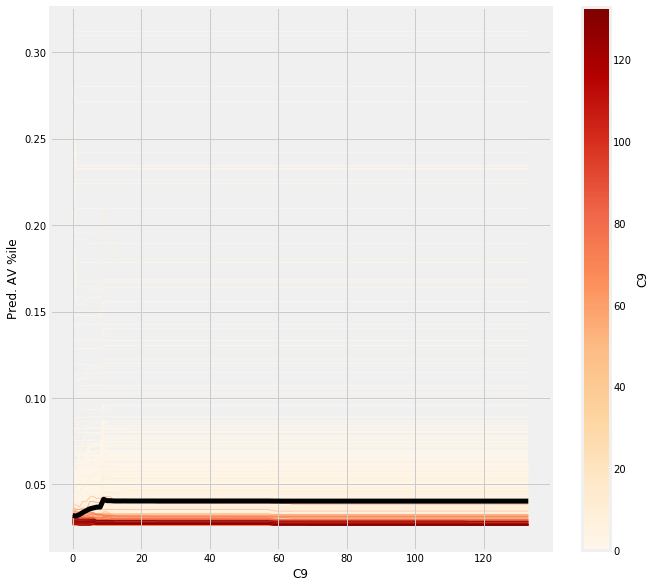

In [157]:
ice_df = ice(data=train_X_df[:5000], column='C9', predict=lgbm.predict)

cmap2 = plt.get_cmap('OrRd')

rcParams['figure.figsize'] = 10,10
ice_plot(ice_df, linewidth=.5, color_by='data_C9', cmap=cmap2, plot_pdp=True, pdp_kwargs={'c': 'k', 'linewidth': 5})

wt_vals = ice_df.columns.get_level_values('data_C9').values
sm = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=wt_vals.min(), vmax=wt_vals.max()))
sm._A = []

plt.colorbar(sm, label='C9')
plt.ylabel('Pred. AV %ile')
plt.xlabel('C9');
plt.show()

#### Visualization of ICE plot for C9 where we can see that Fraud prediction is changing accoridng to C9 changes. Black plot is a PDP plot and other colors are ICE plots showing prediction on different C9. C9 ranking was 20, 40, 60, 80, 100 and 120. For each amount we can see a projection plot with corresponding color, meaning how certain amount affact on Fraud prediction.

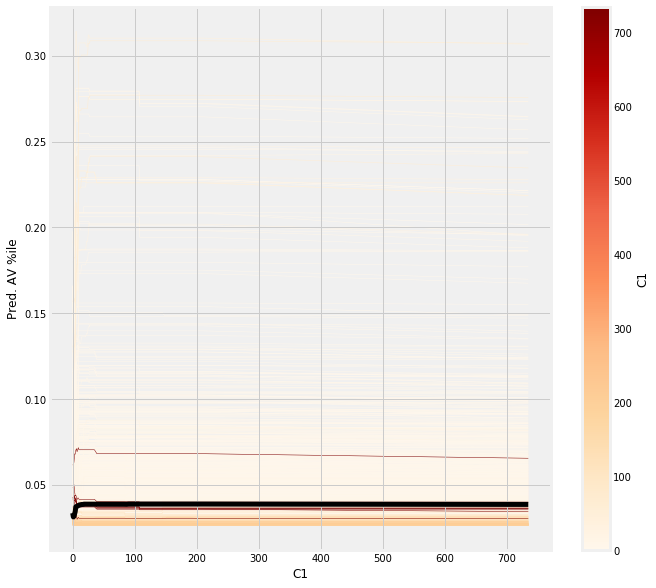

In [158]:
ice_df = ice(data=train_X_df[:5000], column='C1', predict=lgbm.predict)

cmap2 = plt.get_cmap('OrRd')

rcParams['figure.figsize'] = 10,10
ice_plot(ice_df, linewidth=.5, color_by='data_C1', cmap=cmap2, plot_pdp=True, pdp_kwargs={'c': 'k', 'linewidth': 5})

wt_vals = ice_df.columns.get_level_values('data_C1').values
sm = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=wt_vals.min(), vmax=wt_vals.max()))
sm._A = []

plt.colorbar(sm, label='C1')
plt.ylabel('Pred. AV %ile')
plt.xlabel('C1');
plt.show()

#### Visualization of ICE plot for C1 where we can see that Fraud prediction is synchronic changing accoridng to C1 changes. Black plot is a PDP plot and other colors are ICE plots showing prediction on different C1. C1 ranking was 100, 200, 300, 400, 500, 600 and 700. For each amount we can see a projection plot with corresponding color, meaning how certain amount affact on Fraud prediction.

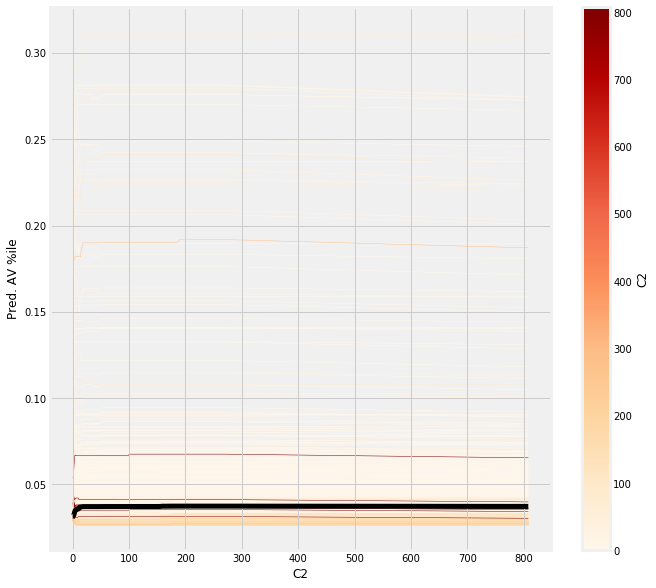

In [159]:
ice_df = ice(data=train_X_df[:5000], column='C2', predict=lgbm.predict)

cmap2 = plt.get_cmap('OrRd')

rcParams['figure.figsize'] = 10,10
ice_plot(ice_df, linewidth=.5, color_by='data_C2', cmap=cmap2, plot_pdp=True, pdp_kwargs={'c': 'k', 'linewidth': 5})

wt_vals = ice_df.columns.get_level_values('data_C2').values
sm = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=wt_vals.min(), vmax=wt_vals.max()))
sm._A = []

plt.colorbar(sm, label='C2')
plt.ylabel('Pred. AV %ile')
plt.xlabel('C2');
plt.show()

#### Visualization of ICE plot for C2 where we can see that Fraud prediction is synchronic changing accoridng to C2 changes. Black plot is a PDP plot and other colors are ICE plots showing prediction on different C2. C2 ranking was 100, 200, 300, 400, 500, 600, 700 and 800. For each amount we can see a projection plot with corresponding color, meaning how certain amount affact on Fraud prediction.

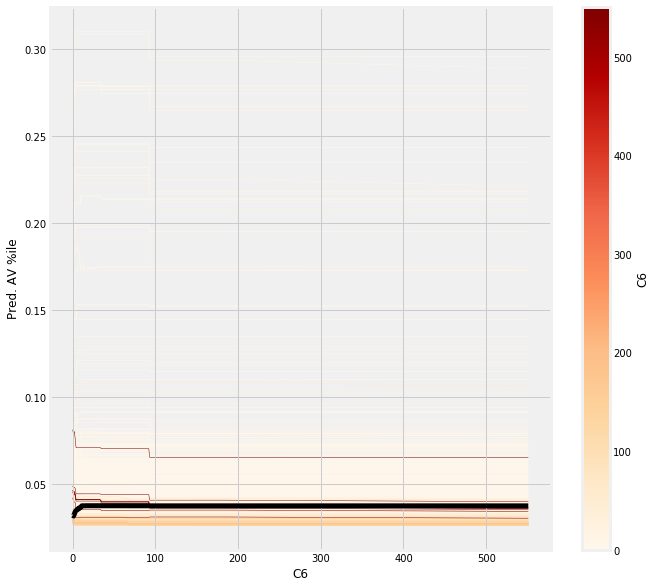

In [160]:
ice_df = ice(data=train_X_df[:5000], column='C6', predict=lgbm.predict)

cmap2 = plt.get_cmap('OrRd')

rcParams['figure.figsize'] = 10,10
ice_plot(ice_df, linewidth=.5, color_by='data_C6', cmap=cmap2, plot_pdp=True, pdp_kwargs={'c': 'k', 'linewidth': 5})

wt_vals = ice_df.columns.get_level_values('data_C6').values
sm = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=wt_vals.min(), vmax=wt_vals.max()))
sm._A = []

plt.colorbar(sm, label='C6')
plt.ylabel('Pred. AV %ile')
plt.xlabel('C6');
plt.show()

#### Visualization of ICE plot for C6 where we can see that Fraud prediction is changing accoridng to C6 changes. Black plot is a PDP plot and other colors are ICE plots showing prediction on different C6. C6 ranking was 100, 200, 300, 400 and 500. For each amount we can see a projection plot with corresponding color, meaning how certain amount affact on Fraud prediction.

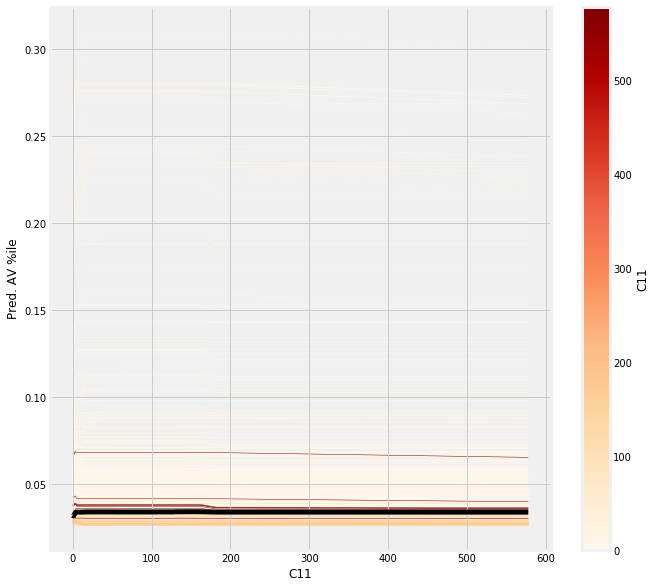

In [161]:
ice_df = ice(data=train_X_df[:5000], column='C11', predict=lgbm.predict)

cmap2 = plt.get_cmap('OrRd')

rcParams['figure.figsize'] = 10,10
ice_plot(ice_df, linewidth=.5, color_by='data_C11', cmap=cmap2, plot_pdp=True, pdp_kwargs={'c': 'k', 'linewidth': 5})

wt_vals = ice_df.columns.get_level_values('data_C11').values
sm = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=wt_vals.min(), vmax=wt_vals.max()))
sm._A = []

plt.colorbar(sm, label='C11')
plt.ylabel('Pred. AV %ile')
plt.xlabel('C11');
plt.show()

#### Visualization of ICE plot for C6 where we can see that Fraud prediction is changing accoridng to C11 changes. Black plot is a PDP plot and other colors are ICE plots showing prediction on different C11. C11 ranking was 100, 200, 300, 400 and 500. For each amount we can see a projection plot with corresponding color, meaning how certain amount affact on Fraud prediction.

## References

1. Interpretable machine learning. A Guide for Making Black Box Models Explainable (https://christophm.github.io/interpretable-ml-book/)

2. Peeking Inside the Black Box: Visualizing Statistical Learning with Plots of Individual Conditional Expectation (https://arxiv.org/pdf/1309.6392.pdf)

3. “Why Should I Trust You?” Explaining the Predictions of Any Classifier 
(https://arxiv.org/pdf/1602.04938.pdf)

4. Consistent Individualized Feature Attribution for Tree Ensembles
(https://arxiv.org/pdf/1802.03888.pdf)

5. A Unified Approach to Interpreting Model Predictions
(https://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions.pdf)

6. On the Robustness of Interpretability Methods
(https://arxiv.org/pdf/1806.08049.pdf)

7. CAUSAL INTERPRETATIONS OF BLACK-BOX MODELS 
(https://web.stanford.edu/~hastie/Papers/pdp_zhao.pdf)
